In [1]:
! pip install torch_geometric torchviz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 661.6/661.6 kB 7.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
  Created wheel for torch_geometric: filename=torch_geometric-2.3.1-py3-none-any.whl size=910454 sha256=cafe2ffca5a154a03845586b074a9da5da1e545f73c0f0993aa21e2983548af4
  Stored in directory: /root/.cache/pip/wheels/ac/dc/30/e2874821ff308ee67dcd7a66dbde912411e19e35a1addda028
  Created wheel for torchviz: filename=torchviz-0.0.2-py3-none-any.whl size=4130 sha256=28e2b28f9f2f8f4e57f6492b16cd401d59fccdc21c6862f70b6ed01b58676e73
  Stored in directory: /root/.cache/pip/wheels/4c/97/88/a02973217949e0db0c9f4346d154085f4725f99c4f15a87094
Successfully built torch_geometric torchviz


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
! if ! [ -d data ]; then cp -r drive/MyDrive/HPCDATA/data .; fi
! if ! [ -d utils ]; then cp -r drive/MyDrive/HPCDATA/utils .; fi

In [4]:
import itertools
import json
import logging
import os
import shutil
from timeit import default_timer

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
import torch_geometric.nn as gnn
from sklearn.metrics import auc, roc_curve
from torch import nn
from torch_geometric.data import Data, HeteroData
from torch_geometric.loader import DataLoader
from torch_geometric.nn import GCNConv, HeteroConv
from torchviz import make_dot
from sklearn.metrics import (auc, roc_curve, confusion_matrix,
                             ConfusionMatrixDisplay, classification_report,
                             precision_recall_curve)
from utils.data_processing import *
from utils.training_multigraph import *
from utils.plotting import *

from tqdm.notebook import tqdm

In [5]:
AGGREGATED_METRICS_PATH = "data/aggregated/"
JOB_TABLE_PATH = 'data/job_table.parquet'
RACKS_DATA_PATH = 'data/racks_spatial_distribution.json'
DROP_TH = 100
KEEPRACKS = np.arange(23,28)
KEEPNODES = np.arange(460,559).astype(str) # set it no None if you don't want to filter nodes
KEEPNODES = KEEPNODES[KEEPNODES!='537']

## Read and process metrics table

In [6]:
data = load_metrics(AGGREGATED_METRICS_PATH,racks=KEEPRACKS)
data = process_metrics(data,KEEPNODES,DROP_TH)
data.head()

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

,timestamp,460,461,463,464,465,467,468,469,470,...,551,552,553,554,555,556,557,558,values,anomalies
0,2022-03-31 02:45:00+00:00,"[0.539976015665201, 0.5405405022263785, 0.5315...","[0.3955845662662844, 0.40540536593020815, 0.37...","[0.4160699413210467, 0.43243241037276337, 0.38...","[0.46081933488446114, 0.47747745580482015, 0.4...","[0.4759347584335139, 0.48648649925787385, 0.45...","[0.5871120678300974, 0.6036036345645427, 0.576...","[0.5280428440482905, 0.5495495456794321, 0.504...","[0.5684167170740713, 0.5945945911114889, 0.540...","[0.612370456611576, 0.6216216355540441, 0.6036...",...,"[0.6630866180691942, 0.6756756385225489, 0.657...","[0.7486076813237196, 0.7477477283971609, 0.747...","[0.7484088436863042, 0.7477477283971609, 0.756...","[0.7758549927365993, 0.7837838162927697, 0.783...","[0.8110581160655834, 0.8108107748187192, 0.819...","[0.7800315542463185, 0.7837838162927697, 0.783...","[0.8337308265224157, 0.8378378192612744, 0.837...","[25.564450412326387, 25.799999237060547, 25.39...","[0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, ...","[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ..."
1,2022-03-31 03:00:00+00:00,"[0.5129274204992378, 0.5045045002473754, 0.522...","[0.3570007782344892, 0.3513513629617035, 0.360...","[0.3747015766319405, 0.36936936395120507, 0.37...","[0.41865537686469456, 0.4144144093832618, 0.42...","[0.4331741661110016, 0.4234234528363155, 0.432...","[0.5624501919608657, 0.5585585891324859, 0.558...","[0.49602203334669837, 0.4954954567943217, 0.49...","[0.5397770566372865, 0.5495495456794321, 0.531...","[0.590095239343826, 0.5855855476584353, 0.5945...",...,"[0.6591088941968907, 0.6666666809861009, 0.639...","[0.7482098846583893, 0.7477477283971609, 0.738...","[0.749403031873382, 0.7477477283971609, 0.7567...","[0.7750595207964381, 0.7747747728397161, 0.774...","[0.810262401344424, 0.8108107748187192, 0.8108...","[0.7800316756368176, 0.7837838162927697, 0.783...","[0.832338720279509, 0.8378378192612744, 0.8378...","[25.533336046006944, 25.799999237060547, 25.39...","[0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, ...","[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ..."
2,2022-03-31 03:15:00+00:00,"[0.5151152414633041, 0.5045045002473754, 0.522...","[0.360381867804047, 0.3513513629617035, 0.3603...","[0.37708811384292334, 0.3783784074042587, 0.37...","[0.4196496864422715, 0.4234234528363155, 0.423...","[0.4321796744476762, 0.43243241037276337, 0.43...","[0.5626489689030316, 0.5675675466689337, 0.558...","[0.492442227530224, 0.4954954567943217, 0.4774...","[0.5385837880317951, 0.5495495456794321, 0.522...","[0.5922830603078925, 0.6036036345645427, 0.594...",...,"[0.649562259790963, 0.6576576375330473, 0.6306...","[0.7400557206668658, 0.7387387708607129, 0.738...","[0.7420443398220197, 0.7387387708607129, 0.747...","[0.7690928135974837, 0.7657657293866624, 0.774...","[0.8062846774721205, 0.8018018172822713, 0.810...","[0.7746619669121062, 0.7747747728397161, 0.774...","[0.8287589144630344, 0.8198198182717729, 0.837...","[25.457777235243057, 25.600000381469727, 25.20...","[0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, ...","[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ..."
3,2022-03-31 03:30:00+00:00,"[0.5079552656588584, 0.5045045002473754, 0.513...","[0.3534208510275159, 0.3513513629617035, 0.360...","[0.3729116130284538, 0.3783784074042587, 0.378...","[0.4188542751973597, 0.4234234528363155, 0.414...","[0.4349641904097378, 0.45045041136226494, 0.43...","[0.5670245501359148, 0.5675675466689337, 0.558...","[0.4996021426394202, 0.5135135437004291, 0.495...","[0.5459426014736564, 0.5585585891324859, 0.540...","[0.5956641498774502, 0.5945945911114889, 0.594...",...,"[0.6549322719919222, 0.6666666809861009, 0.648...","[0.7452264703636629, 0.7477477283971609, 0.747...","[0.7452264703636629, 0.7387387708607129, 0.756...","[0.7716784312268805, 0.7657657293866624, 0.774...","[0.8080744589898586, 0.8018018172822713, 0.810...","[0.777843733282252, 0.7747747728397161, 0.7837...","[0.8311456944550154, 0.8288


## Read Jobs and Racks Tables

In [7]:
node_columns = data.columns[1:-3]
nodes = list(node_columns.astype(int))

racks = pd.read_json(RACKS_DATA_PATH)

jobtable = pd.read_parquet(JOB_TABLE_PATH)[['start_time','end_time','nodes']]
jobtable = jobtable.dropna(subset=['nodes'])
jobtable.nodes = jobtable.nodes.map(lambda x:np.fromstring(x.strip(']['),dtype=int,sep=',')) # map nodelist from str to array
jobtable.nodes = jobtable.nodes.map(lambda a : np.intersect1d(a,nodes)) # Keep only jobs where the selected nodes appear
jobtable = jobtable[jobtable.nodes.map(len)>0] # Drop rows without any node of interest
jobtable = jobtable.reset_index() # Not really necessary, but meh
print("Data covering the period from {} to {}".format(jobtable.start_time.min().date(),jobtable.end_time.max().date()))
jobtable.head()

Data covering the period from 2022-03-31 to 2022-04-30


,index,start_time,end_time,nodes
0,19,2022-04-02 05:36:25+00:00,2022-04-02 13:23:12+00:00,"[529, 530, 531, 532, 533, 534, 535, 536]"
1,780,2022-04-01 23:28:45+00:00,2022-04-01 23:29:22+00:00,"[467, 493, 494, 495, 512, 513, 514]"
2,2096,2022-04-02 16:09:02+00:00,2022-04-02 16:11:31+00:00,"[474, 491, 512, 536, 552]"
3,2953,2022-04-08 22:16:15+00:00,2022-04-09 05:46:26+00:00,"[463, 464, 488, 489, 507, 512, 513, 522, 542]"
4,3015,2022-04-09 06:01:58+00:00,2022-04-09 06:02:12+00:00,[464]


In [8]:
data_list = []
job_proximity = ('node', 'same_job', 'node')
node_proximity = ('node', 'same_rack', 'node')

node_columns = data.columns[1:-3]
num_nodes = len(node_columns)
num_node_features = data[node_columns[0]][0].shape[0]

# Build Node proximity graph (global and static)
racks = pd.read_json(RACKS_DATA_PATH)
edgelist_racks = get_edgelist_racks(racks,nodes).apply_(lambda x: nodes.index(x))
eweights_racks = torch.full((edgelist_racks.shape[1],),1.)

# Build Job proximity graphs and create data structures for training
for i,row in tqdm(data.iterrows(), total=len(data)):
  timestamp = row['timestamp']
  jobs = jobtable[(jobtable['start_time']<timestamp) & (jobtable['end_time']>timestamp)]

  edgelist_jobs,eweights_jobs = get_edgelist_jobs(jobs,nodes)

  graph = HeteroData()
  graph[job_proximity] = {
    'edge_index':edgelist_jobs,
    'edge_weight': eweights_jobs,
    }
  graph[node_proximity] = {
    'edge_index':edgelist_racks,
    'edge_weight': eweights_racks}

  graph['node'].num_nodes = num_nodes
  graph['node'].x = torch.tensor(np.stack(row.iloc[1:-2]),dtype = torch.float32)
  graph['node'].anomalies = torch.tensor(row['anomalies'])
  graph['node'].id = torch.tensor(nodes)
  data_list.append(graph)

  0%|          | 0/2963 [00:00<?, ?it/s]

## Model Definition

In [9]:
class MLP(nn.Module):
    def __init__(self,
                 input_dim,
                 output_dim,
                 hidden_dims = [],
                 activation=F.relu,
                 activate_last=True):
        super().__init__()

        last_hidden_dim = input_dim
        self.hidden_layers = nn.Sequential()
        for dim in hidden_dims:
            self.hidden_layers.append(nn.Linear(last_hidden_dim,dim))
            last_hidden_dim = dim

        self.activation = activation
        self.activate_last = activate_last

        self.output = nn.Linear(last_hidden_dim,output_dim)

    def forward(self,x):
        for layer in self.hidden_layers:
            x = layer(x)
            self.activation(x)

        x = self.output(x)
        if self.activate_last:
            x = self.activation(x)
        return x

class MultiGraphAnomalyPredictor(nn.Module):
    def __init__(self,
                 in_channels,
                 hidden_channels,
                 out_channels,
                 conv_layer=GCNConv,
                 agg = 'sum',
                 **conv_layer_kwargs):
        super().__init__()

        #encoder
        last_hidden_dim = in_channels
        convs = []
        for dim in hidden_channels:
            convs.append((conv_layer(last_hidden_dim, dim, **conv_layer_kwargs),'x,edge_index_jobs,eweight_jobs-> h_j'))
            convs.append((conv_layer(last_hidden_dim, dim, **conv_layer_kwargs),'x,edge_index_racks,eweight_racks-> h_r'))

            if agg == 'mlp':
                convs.append((lambda h_j,h_r:torch.cat((h_j,h_r),dim=1), 'h_j,h_r -> h_s'))
                convs.append((MLP(2*dim,dim),'h_s-> x'))
            elif agg == 'sum':
                convs.append((torch.add, 'h_j,h_r -> x'))
            elif agg == 'mean':
                convs.append((lambda h_j,h_r: (h_j + h_r)/2, 'h_j,h_r -> x'))
            else:
                raise ValueError(f'aggregation type {agg} not supported')
            last_hidden_dim = dim

        self.convs = gnn.Sequential('x,edge_index_jobs, edge_index_racks,eweight_jobs,eweight_racks',convs)
        self.out_layers = MLP(last_hidden_dim,1,out_channels,activate_last=False)


    def forward(self,
                x,
                edge_index_jobs,
                edge_index_racks,
                eweight_jobs=None,
                eweight_racks=None):

        x = self.convs(x,edge_index_jobs,edge_index_racks,eweight_jobs,eweight_racks)
        x = self.out_layers(x)
        return x

convs.module_0.bias torch.Size([300]) 300
convs.module_0.lin.weight torch.Size([300, 416]) 124800
convs.module_1.bias torch.Size([300]) 300
convs.module_1.lin.weight torch.Size([300, 416]) 124800
convs.module_3.output.weight torch.Size([300, 600]) 180000
convs.module_3.output.bias torch.Size([300]) 300
convs.module_4.bias torch.Size([100]) 100
convs.module_4.lin.weight torch.Size([100, 300]) 30000
convs.module_5.bias torch.Size([100]) 100
convs.module_5.lin.weight torch.Size([100, 300]) 30000
convs.module_7.output.weight torch.Size([100, 200]) 20000
convs.module_7.output.bias torch.Size([100]) 100
out_layers.hidden_layers.0.weight torch.Size([16, 100]) 1600
out_layers.hidden_layers.0.bias torch.Size([16]) 16
out_layers.hidden_layers.1.weight torch.Size([1, 16]) 16
out_layers.hidden_layers.1.bias torch.Size([1]) 1
out_layers.output.weight torch.Size([1, 1]) 1
out_layers.output.bias torch.Size([1]) 1
Total trainable Params: 512435


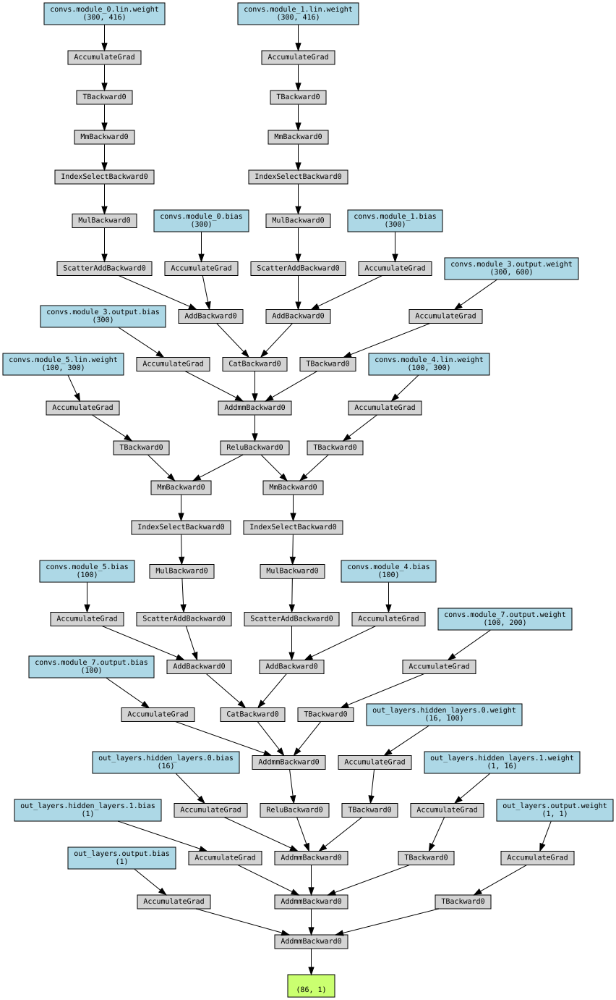

In [10]:
in_channels = num_node_features
HIDDEN_CHANNELS = [300,100]
OUT_CHANNELS = [16,1]
conv_type = GCNConv
agg = 'mlp'
model = MultiGraphAnomalyPredictor(in_channels,HIDDEN_CHANNELS,OUT_CHANNELS,GCNConv,agg)

tot_params = 0
for name,param in model.named_parameters():
    print(name,param.shape,param.numel())
    tot_params += param.numel()
print('Total trainable Params:',tot_params)

g = data_list[0]

x = g['node'].x
edge_list_jobs,eweight_jobs = g[job_proximity].values()
edge_list_racks,eweight_racks = g[node_proximity].values()
out = model (x,edge_list_jobs,edge_list_racks)

make_dot(out, params=dict(list(model.named_parameters())))


In [28]:
def train(train_data, logpath, logger_name,device, num_epochs, initial_lr, batch_size,es_patience, es_min_delta = 0, max_num_ckpt=-1, apply_weight_balancing = False):
  # Create model
  in_channels, out_channels = num_node_features, 16
  model = MultiGraphAnomalyPredictor(in_channels,HIDDEN_CHANNELS,OUT_CHANNELS,GCNConv,agg).to(device)

  # Prepare dataloader
  train_loader = DataLoader(train_data, batch_size = batch_size, shuffle = False)

  # Compute weight balancing
  pos_weight = None
  if apply_weight_balancing:
    train_labels = torch.cat([g['node'].y for g in train_data])
    train_ones = len(train_labels.nonzero())
    train_zeros = len(train_labels)-train_ones
    pos_weight = torch.tensor(train_zeros/train_ones)

  # Set up training
  criterion = torch.nn.BCEWithLogitsLoss(weight = pos_weight)
  optimizer = torch.optim.Adam([p for p in model.parameters()],lr = initial_lr)
  scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer,T_max=num_epochs,eta_min=initial_lr * 1e-1)
  trainer =  MyTrainer(model,
                       optimizer,
                       scheduler,
                       es_patience,
                       es_min_delta,
                       max_num_ckpt)

  trainer.train(num_epochs,criterion,train_loader,logger_name,device,logpath)
  model.load_state_dict(torch.load(os.path.join(logpath,'BestModel/best-model.pt'))['model'])
  return model

def get_predictions(model,dataloader,device):
    model.eval()
    preds = []
    y_true = []
    anomalies = []
    with torch.no_grad():
        for g in tqdm(dataloader):
          g = g.to(device)
          x = g['node'].x
          y = g['node'].y
          a = g['node'].anomalies
          edge_list_jobs,eweight_jobs = g[('node','same_job','node')].values()
          edge_list_racks,eweight_racks = g[('node','same_rack','node')].values()

          # Forward pass
          logits = model (x,edge_list_jobs,edge_list_racks,eweight_jobs,eweight_racks).squeeze()

          pred = torch.sigmoid(logits)
          preds.append(pred.detach().cpu().numpy())
          y_true.append(y.detach().cpu().numpy())
          anomalies.append(a.detach().cpu().numpy())

    preds = np.concatenate(preds).astype(float)
    y_true = np.concatenate(y_true).astype(int)
    anomalies = np.concatenate(anomalies).astype(int)
    print(len(y_true),anomalies.shape)

    return pd.DataFrame({'prob': preds,'true_class': y_true,'anomaly':anomalies})

## Training Setup

In [13]:
TRAIN_SPLIT = 0.7
NUM_EPOCHS = 200
INITIAL_LR = 1e-3

TRAIN_BATCH_SIZE = 64
TEST_BATCH_SIZE = 64

ES_PATIENCE = 50
ES_MIN_DELTA = 0

APPLY_WEIGHT_BALANCING = False # whether to use weight balancing inside the loss

LOGGER_NAME = f'train.output'
BASE_LOGPATH = f'out'

MAX_NUM_CKPT = 10
# Select device
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Available device:',device)

if not os.path.exists(BASE_LOGPATH):
  os.makedirs(BASE_LOGPATH)

Available device: cuda


## Window size 4

In [31]:
window_size = 4
labels = compute_labels(data,window_size)
for i,g in enumerate(data_list):
  g['node'].y = labels[i]

  0%|          | 0/2963 [00:00<?, ?it/s]

In [32]:
train_data, test_data = train_test_split(data_list,TRAIN_SPLIT) # train/test split, drop last window_size samples
logpath = f'{BASE_LOGPATH}/{window_size:02d}'
logger_name = f'{logpath}/{LOGGER_NAME}'
model = train(train_data, logpath, logger_name,device, NUM_EPOCHS, INITIAL_LR, TRAIN_BATCH_SIZE,ES_PATIENCE, ES_MIN_DELTA,MAX_NUM_CKPT,APPLY_WEIGHT_BALANCING)

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 1/200	 Train Loss: 0.11416030079290103, Train Acc at 50%: 0.997577986589222


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 2/200	 Train Loss: 0.020192580310663868, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 3/200	 Train Loss: 0.013956026359281441, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 4/200	 Train Loss: 0.01317802966957668, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 5/200	 Train Loss: 0.013968646487572465, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 6/200	 Train Loss: 0.012837418977133839, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 7/200	 Train Loss: 0.012555168849760882, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 8/200	 Train Loss: 0.013828322158707055, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 9/200	 Train Loss: 0.015818657374280964, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 10/200	 Train Loss: 0.013375911091135964, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 11/200	 Train Loss: 0.013986377630943604, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 12/200	 Train Loss: 0.01245052033692337, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 13/200	 Train Loss: 0.010091169558809513, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 14/200	 Train Loss: 0.00957356430464002, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 15/200	 Train Loss: 0.009216525544979298, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 16/200	 Train Loss: 0.008905084184851624, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 17/200	 Train Loss: 0.009001880705721516, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 18/200	 Train Loss: 0.008787911358146123, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 19/200	 Train Loss: 0.008899781540925439, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 20/200	 Train Loss: 0.0084734559500253, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 21/200	 Train Loss: 0.008536351959248362, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 22/200	 Train Loss: 0.008275493770595173, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 23/200	 Train Loss: 0.008083927203902554, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 24/200	 Train Loss: 0.008055542181078791, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 25/200	 Train Loss: 0.008865080978846277, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 26/200	 Train Loss: 0.009112170634909511, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 27/200	 Train Loss: 0.009178131336892183, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 28/200	 Train Loss: 0.008027541784724637, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 29/200	 Train Loss: 0.008150458001702277, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 30/200	 Train Loss: 0.008324711586541427, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 31/200	 Train Loss: 0.008361697322609944, Train Acc at 50%: 0.9978639187279944


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 32/200	 Train Loss: 0.008497277468757709, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 33/200	 Train Loss: 0.008594297100355523, Train Acc at 50%: 0.9977742145275953


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 34/200	 Train Loss: 0.007770690692120467, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 35/200	 Train Loss: 0.007858719508894031, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 36/200	 Train Loss: 0.009414539053564621, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 37/200	 Train Loss: 0.009729921124033928, Train Acc at 50%: 0.997589199614272


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 38/200	 Train Loss: 0.008791985524291267, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 39/200	 Train Loss: 0.010084900557988158, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 40/200	 Train Loss: 0.008984663538291079, Train Acc at 50%: 0.9978639187279944


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 41/200	 Train Loss: 0.008126641958079755, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 42/200	 Train Loss: 0.008157772064123436, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 43/200	 Train Loss: 0.009356129212505747, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 44/200	 Train Loss: 0.008361157339897275, Train Acc at 50%: 0.9975163149514475


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 45/200	 Train Loss: 0.008159046395949785, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 46/200	 Train Loss: 0.008933671102352493, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 47/200	 Train Loss: 0.007851135797310907, Train Acc at 50%: 0.9975051019263977


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 48/200	 Train Loss: 0.007785097075012334, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 49/200	 Train Loss: 0.007561239678979853, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 50/200	 Train Loss: 0.007332406776836974, Train Acc at 50%: 0.9977573949900204


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 51/200	 Train Loss: 0.007536123981147751, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 52/200	 Train Loss: 0.007191300191646367, Train Acc at 50%: 0.9975051019263977


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 53/200	 Train Loss: 0.0073175719665963986, Train Acc at 50%: 0.9977125428898208


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 54/200	 Train Loss: 0.007056983427105175, Train Acc at 50%: 0.9975499540265973


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 55/200	 Train Loss: 0.00712369353475372, Train Acc at 50%: 0.9975331344890225


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 56/200	 Train Loss: 0.0069948792556496124, Train Acc at 50%: 0.9976060191518468


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 57/200	 Train Loss: 0.006960294355266828, Train Acc at 50%: 0.997589199614272


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 58/200	 Train Loss: 0.006928834373852417, Train Acc at 50%: 0.9976060191518468


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 59/200	 Train Loss: 0.006887590371068783, Train Acc at 50%: 0.9976116256643718


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 60/200	 Train Loss: 0.006845549739796498, Train Acc at 50%: 0.9976116256643718


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 61/200	 Train Loss: 0.006789130785570518, Train Acc at 50%: 0.9976228386894216


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 62/200	 Train Loss: 0.0067399465046723275, Train Acc at 50%: 0.9976676907896213


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 63/200	 Train Loss: 0.0067085330616919615, Train Acc at 50%: 0.9976340517144715


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 64/200	 Train Loss: 0.0070527983899848065, Train Acc at 50%: 0.9977910340651701


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 65/200	 Train Loss: 0.007407000358334992, Train Acc at 50%: 0.9978246731403198


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 66/200	 Train Loss: 0.009606865291754151, Train Acc at 50%: 0.9980769662039425


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 67/200	 Train Loss: 0.009874545467327347, Train Acc at 50%: 0.9974266107510484


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 68/200	 Train Loss: 0.010775076485095087, Train Acc at 50%: 0.9977854275526451


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 69/200	 Train Loss: 0.008153877892215848, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 70/200	 Train Loss: 0.007739828182072545, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 71/200	 Train Loss: 0.007850806606328913, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 72/200	 Train Loss: 0.008740399038929871, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 73/200	 Train Loss: 0.007526814241172546, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 74/200	 Train Loss: 0.007828726172540773, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 75/200	 Train Loss: 0.008260901233967126, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 76/200	 Train Loss: 0.007513173689276213, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 77/200	 Train Loss: 0.007536329297768538, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 78/200	 Train Loss: 0.0073734926858226016, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 79/200	 Train Loss: 0.009219458835101604, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 80/200	 Train Loss: 0.008021494525853731, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 81/200	 Train Loss: 0.007922536705355691, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 82/200	 Train Loss: 0.008196534473350494, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 83/200	 Train Loss: 0.007181518907832088, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 84/200	 Train Loss: 0.007452179596350371, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 85/200	 Train Loss: 0.00731587947325238, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 86/200	 Train Loss: 0.00696260211408447, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 87/200	 Train Loss: 0.00697630426096704, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 88/200	 Train Loss: 0.006904987532736777, Train Acc at 50%: 0.9979199838532439


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 89/200	 Train Loss: 0.007384965094203427, Train Acc at 50%: 0.9976116256643718


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 90/200	 Train Loss: 0.007190213382333669, Train Acc at 50%: 0.9976340517144715


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 91/200	 Train Loss: 0.007865379980072352, Train Acc at 50%: 0.9976284452019466


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 92/200	 Train Loss: 0.007199560079300615, Train Acc at 50%: 0.9974210042385234


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 93/200	 Train Loss: 0.007020347413680732, Train Acc at 50%: 0.9979592294409185


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 94/200	 Train Loss: 0.0069225838515269335, Train Acc at 50%: 0.997477069363773


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 95/200	 Train Loss: 0.006593954068295733, Train Acc at 50%: 0.9975835931017469


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 96/200	 Train Loss: 0.006735044228156677, Train Acc at 50%: 0.9975723800766971


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 97/200	 Train Loss: 0.006522629127400639, Train Acc at 50%: 0.9976172321768967


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 98/200	 Train Loss: 0.0066534596157208714, Train Acc at 50%: 0.9976845103271961


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 99/200	 Train Loss: 0.006466598905976682, Train Acc at 50%: 0.997690116839721


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 100/200	 Train Loss: 0.006513819675591417, Train Acc at 50%: 0.9977686080150703


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 101/200	 Train Loss: 0.006368214603239373, Train Acc at 50%: 0.9977237559148707


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 102/200	 Train Loss: 0.006505531727998994, Train Acc at 50%: 0.9977349689399206


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 103/200	 Train Loss: 0.006255666191222724, Train Acc at 50%: 0.9977069363772959


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 104/200	 Train Loss: 0.006472464117443823, Train Acc at 50%: 0.9978302796528448


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 105/200	 Train Loss: 0.006252982018600306, Train Acc at 50%: 0.9980265075912179


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 106/200	 Train Loss: 0.006275089143549147, Train Acc at 50%: 0.9977854275526451


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 107/200	 Train Loss: 0.006093659058424766, Train Acc at 50%: 0.9976789038146712


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 108/200	 Train Loss: 0.006401987134192578, Train Acc at 50%: 0.9979199838532439


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 109/200	 Train Loss: 0.006766587704996874, Train Acc at 50%: 0.9977686080150703


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 110/200	 Train Loss: 0.006656549630863711, Train Acc at 50%: 0.997471462851248


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 111/200	 Train Loss: 0.007289512028422215, Train Acc at 50%: 0.9979592294409185


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 112/200	 Train Loss: 0.006881309735638918, Train Acc at 50%: 0.9979480164158687


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 113/200	 Train Loss: 0.007181583240373267, Train Acc at 50%: 0.9977069363772959


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 114/200	 Train Loss: 0.006238133520585012, Train Acc at 50%: 0.9980601466663677


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 115/200	 Train Loss: 0.006177305049733271, Train Acc at 50%: 0.9977854275526451


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 116/200	 Train Loss: 0.006063574698369626, Train Acc at 50%: 0.997695723352246


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 117/200	 Train Loss: 0.005939811208136872, Train Acc at 50%: 0.998020901078693


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 118/200	 Train Loss: 0.005905975029031223, Train Acc at 50%: 0.9979816554910184


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 119/200	 Train Loss: 0.0058546780401051365, Train Acc at 50%: 0.9979984750285932


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 120/200	 Train Loss: 0.005835172276741663, Train Acc at 50%: 0.9979872620035433


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 121/200	 Train Loss: 0.005780506726457203, Train Acc at 50%: 0.9979704424659684


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 122/200	 Train Loss: 0.005760625918066426, Train Acc at 50%: 0.9979928685160683


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 123/200	 Train Loss: 0.005706304615316151, Train Acc at 50%: 0.9979984750285932


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 124/200	 Train Loss: 0.005677116804505113, Train Acc at 50%: 0.9979928685160683


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 125/200	 Train Loss: 0.0056384276248728025, Train Acc at 50%: 0.9979760489784935


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 126/200	 Train Loss: 0.005614016847438735, Train Acc at 50%: 0.9979536229283936


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 127/200	 Train Loss: 0.005568868406916474, Train Acc at 50%: 0.9979984750285932


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 128/200	 Train Loss: 0.00556491435099449, Train Acc at 50%: 0.9979311968782938


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 129/200	 Train Loss: 0.005506802561230125, Train Acc at 50%: 0.9979872620035433


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 130/200	 Train Loss: 0.005506519224293439, Train Acc at 50%: 0.9979872620035433


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 131/200	 Train Loss: 0.005468259840787308, Train Acc at 50%: 0.9979199838532439


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 132/200	 Train Loss: 0.005476978611089016, Train Acc at 50%: 0.9977405754524455


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 133/200	 Train Loss: 0.0053411705634921775, Train Acc at 50%: 0.9977237559148707


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 134/200	 Train Loss: 0.005471449092296862, Train Acc at 50%: 0.9978807382655693


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 135/200	 Train Loss: 0.0054538691988363685, Train Acc at 50%: 0.9978302796528448


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 136/200	 Train Loss: 0.005365095082729349, Train Acc at 50%: 0.997914377340719


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 137/200	 Train Loss: 0.00535829876038694, Train Acc at 50%: 0.9977798210401202


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 138/200	 Train Loss: 0.005351656083315754, Train Acc at 50%: 0.9978751317530443


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 139/200	 Train Loss: 0.005292745611896529, Train Acc at 50%: 0.9978470991904196


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 140/200	 Train Loss: 0.0052534815457260155, Train Acc at 50%: 0.9979199838532439


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 141/200	 Train Loss: 0.005205292366049903, Train Acc at 50%: 0.9979087708281941


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 142/200	 Train Loss: 0.005228375429336217, Train Acc at 50%: 0.9978975578031442


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 143/200	 Train Loss: 0.005194105347771972, Train Acc at 50%: 0.9979311968782938


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 144/200	 Train Loss: 0.005158285810109523, Train Acc at 50%: 0.9979760489784935


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 145/200	 Train Loss: 0.005118038619519809, Train Acc at 50%: 0.9979255903657689


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 146/200	 Train Loss: 0.005141370115917274, Train Acc at 50%: 0.997914377340719


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 147/200	 Train Loss: 0.00504871483128865, Train Acc at 50%: 0.9979984750285932


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 148/200	 Train Loss: 0.005125113830272119, Train Acc at 50%: 0.9979928685160683


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 149/200	 Train Loss: 0.005052435852846041, Train Acc at 50%: 0.9979872620035433


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 150/200	 Train Loss: 0.005098857940805915, Train Acc at 50%: 0.9977405754524455


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 151/200	 Train Loss: 0.004964474448362968, Train Acc at 50%: 0.9977573949900204


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 152/200	 Train Loss: 0.005101659828290917, Train Acc at 50%: 0.997796640577695


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 153/200	 Train Loss: 0.005027073775068995, Train Acc at 50%: 0.9978863447780942


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 154/200	 Train Loss: 0.0049900503976200005, Train Acc at 50%: 0.9979816554910184


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 155/200	 Train Loss: 0.004950139241899641, Train Acc at 50%: 0.9979592294409185


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 156/200	 Train Loss: 0.004924501355462005, Train Acc at 50%: 0.9979031643156691


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 157/200	 Train Loss: 0.004888605850649865, Train Acc at 50%: 0.9980265075912179


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 158/200	 Train Loss: 0.00490611114573814, Train Acc at 50%: 0.9980657531788926


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 159/200	 Train Loss: 0.004851451412757934, Train Acc at 50%: 0.9980601466663677


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 160/200	 Train Loss: 0.004831875157354658, Train Acc at 50%: 0.9980489336413177


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 161/200	 Train Loss: 0.004807433924621841, Train Acc at 50%: 0.9980657531788926


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 162/200	 Train Loss: 0.004819235181790293, Train Acc at 50%: 0.9980657531788926


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 163/200	 Train Loss: 0.004772364477014, Train Acc at 50%: 0.9980825727164675


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 164/200	 Train Loss: 0.004780565849431324, Train Acc at 50%: 0.9981778834293916


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 165/200	 Train Loss: 0.004740383675771526, Train Acc at 50%: 0.9981610638918167


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 166/200	 Train Loss: 0.004769260774096441, Train Acc at 50%: 0.998127424816667


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 167/200	 Train Loss: 0.004692844665394573, Train Acc at 50%: 0.9982339485546411


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 168/200	 Train Loss: 0.004719571414311114, Train Acc at 50%: 0.9981834899419165


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 169/200	 Train Loss: 0.0047118268713750395, Train Acc at 50%: 0.9980265075912179


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 170/200	 Train Loss: 0.004683783358530519, Train Acc at 50%: 0.9983853243928147


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 171/200	 Train Loss: 0.004751291805639556, Train Acc at 50%: 0.9980657531788926


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 172/200	 Train Loss: 0.004684362693595506, Train Acc at 50%: 0.9983965374178646


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 173/200	 Train Loss: 0.004779584093789596, Train Acc at 50%: 0.9977742145275953


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 174/200	 Train Loss: 0.0046822113176040285, Train Acc at 50%: 0.9984133569554394


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 175/200	 Train Loss: 0.004810315543394582, Train Acc at 50%: 0.9979424099033437


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 176/200	 Train Loss: 0.004630429781452886, Train Acc at 50%: 0.998458209055639


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 177/200	 Train Loss: 0.004665415049246204, Train Acc at 50%: 0.9982003094794913


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 178/200	 Train Loss: 0.004553710830735357, Train Acc at 50%: 0.99834607880514


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 179/200	 Train Loss: 0.0046609648114906525, Train Acc at 50%: 0.9978527057029445


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 180/200	 Train Loss: 0.004573503695173563, Train Acc at 50%: 0.9984245699804893


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 181/200	 Train Loss: 0.004730975726012711, Train Acc at 50%: 0.9981947029669664


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 182/200	 Train Loss: 0.004578635241915759, Train Acc at 50%: 0.9984245699804893


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 183/200	 Train Loss: 0.004606874147744395, Train Acc at 50%: 0.9982507680922159


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 184/200	 Train Loss: 0.004500941037249494, Train Acc at 50%: 0.9984133569554394


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 185/200	 Train Loss: 0.00454930542044201, Train Acc at 50%: 0.9982675876297907


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 186/200	 Train Loss: 0.0044813411704348275, Train Acc at 50%: 0.9984357830055393


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 187/200	 Train Loss: 0.0045527218890119014, Train Acc at 50%: 0.9982059159920164


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 188/200	 Train Loss: 0.004458367267151898, Train Acc at 50%: 0.9984413895180642


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 189/200	 Train Loss: 0.004549402603642516, Train Acc at 50%: 0.998127424816667


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 190/200	 Train Loss: 0.0044440566986830654, Train Acc at 50%: 0.998463815568164


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 191/200	 Train Loss: 0.004539466305779544, Train Acc at 50%: 0.9980937857415173


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 192/200	 Train Loss: 0.0044144664672952855, Train Acc at 50%: 0.9984862416182638


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 193/200	 Train Loss: 0.0045353596311694415, Train Acc at 50%: 0.9979928685160683


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 194/200	 Train Loss: 0.0044038457806963565, Train Acc at 50%: 0.9984694220806889


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 195/200	 Train Loss: 0.004525883926925767, Train Acc at 50%: 0.9981890964544414


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 196/200	 Train Loss: 0.004387039588701861, Train Acc at 50%: 0.998458209055639


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 197/200	 Train Loss: 0.004518439830644777, Train Acc at 50%: 0.9979536229283936


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 198/200	 Train Loss: 0.004378755747441854, Train Acc at 50%: 0.9984413895180642


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 199/200	 Train Loss: 0.004521250615183347, Train Acc at 50%: 0.998245161579691


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 200/200	 Train Loss: 0.004378749245748862, Train Acc at 50%: 0.9984469960305892


In [33]:
test_loader = DataLoader(test_data, batch_size = TEST_BATCH_SIZE, shuffle = False)
predictions = get_predictions(model,test_loader,device)
predictions.to_csv(os.path.join(logpath,'predictions.csv'))

  0%|          | 0/14 [00:00<?, ?it/s]

76454 (76454,)


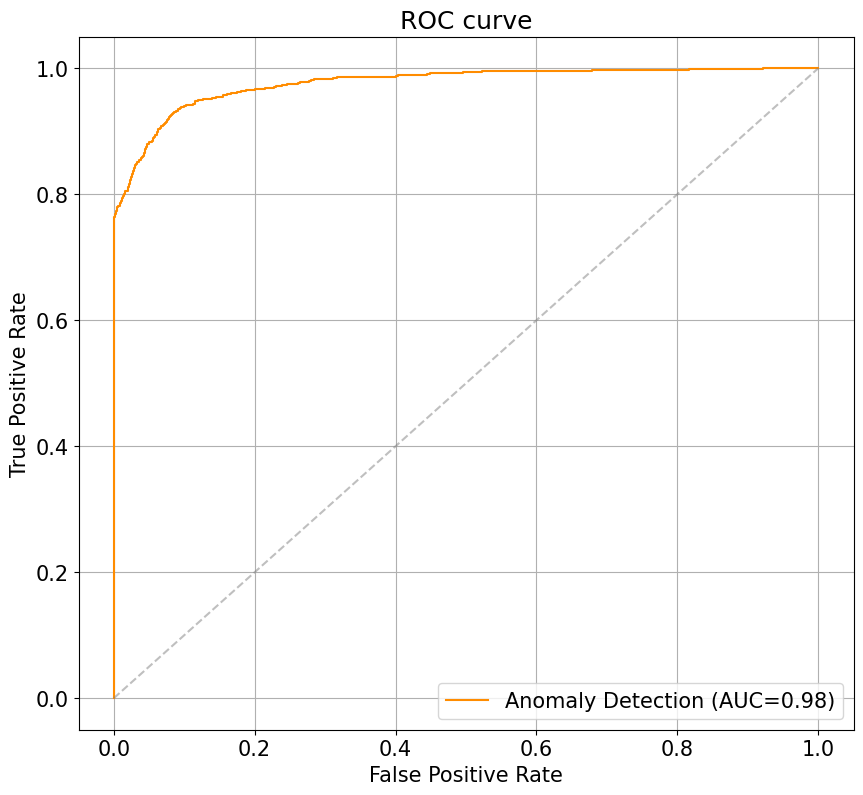


Best probability threshold: p=0.01%


In [34]:
fpr,tpr,thr = plot_roc_curve(predictions,save_as=os.path.join(logpath,'ROC_curve.png'))
th = thr[np.argmax(tpr-fpr)]
print(f"\nBest probability threshold: p={th*100:.2f}%")

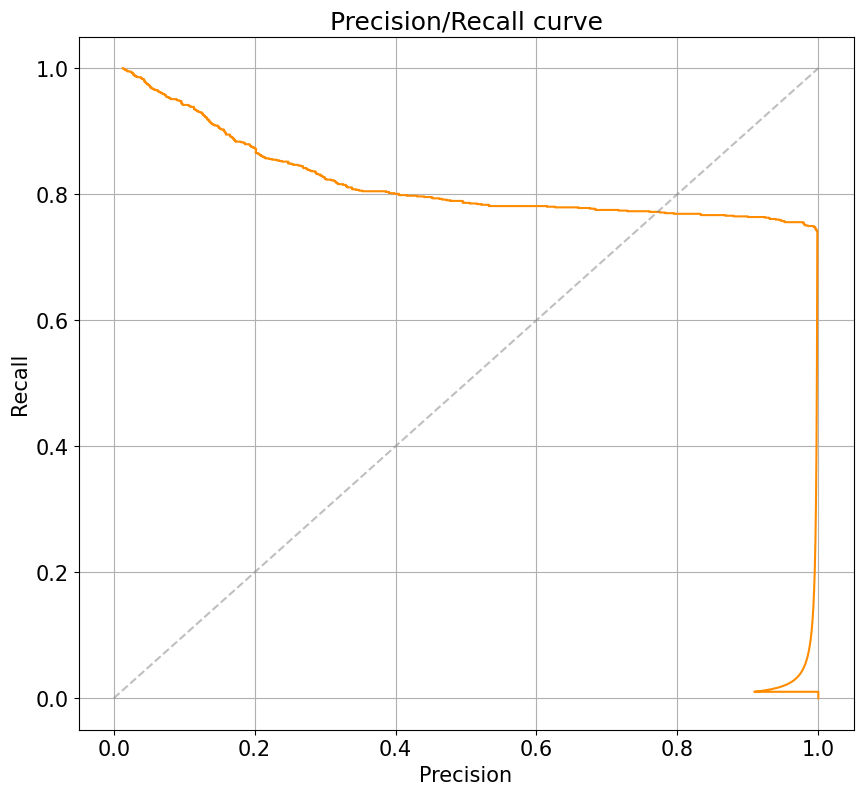

In [35]:
plot_pr_curve(predictions,save_as=os.path.join(logpath,'PR_curve.png'))

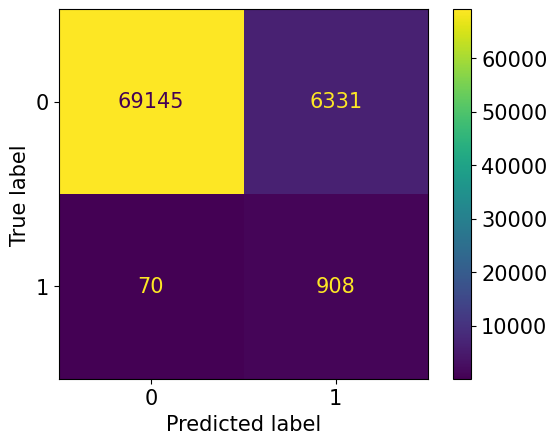


Classification Report
              precision    recall  f1-score   support

           0       1.00      0.92      0.96     75476
           1       0.13      0.93      0.22       978

    accuracy                           0.92     76454
   macro avg       0.56      0.92      0.59     76454
weighted avg       0.99      0.92      0.95     76454



In [36]:
plot_classification_report(predictions,th,save_fig_as=os.path.join(logpath,'CM.png'))

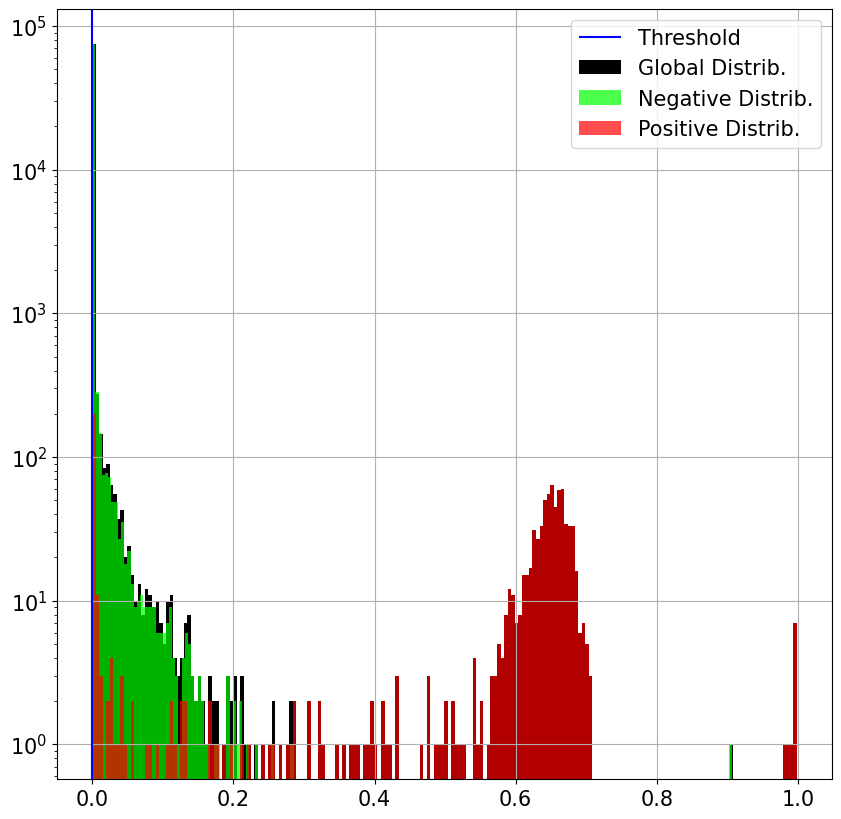

In [37]:
plot_distributions(predictions, th,save_as=os.path.join(logpath,'Prob_distr.png'))

## Window size 24

In [38]:
window_size = 24
labels = compute_labels(data,window_size)
for i,g in enumerate(data_list):
  g['node'].y = labels[i]

  0%|          | 0/2963 [00:00<?, ?it/s]

In [39]:
train_data, test_data = train_test_split(data_list,TRAIN_SPLIT) # train/test split, drop last window_size samples
logpath = f'{BASE_LOGPATH}/{window_size:02d}'
logger_name = f'{logpath}/{LOGGER_NAME}'
model = train(train_data, logpath, logger_name,device, NUM_EPOCHS, INITIAL_LR, TRAIN_BATCH_SIZE,ES_PATIENCE, ES_MIN_DELTA,MAX_NUM_CKPT,APPLY_WEIGHT_BALANCING)

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 1/200	 Train Loss: 0.2570242593796955, Train Acc at 50%: 0.9329461102016102


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 2/200	 Train Loss: 0.0321643871521159, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 3/200	 Train Loss: 0.022171363044374847, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 4/200	 Train Loss: 0.02142080486787202, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 5/200	 Train Loss: 0.02097779867031043, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 6/200	 Train Loss: 0.021097061620215542, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 7/200	 Train Loss: 0.019691814441342565, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 8/200	 Train Loss: 0.02002650653999686, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 9/200	 Train Loss: 0.020215916597782484, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 10/200	 Train Loss: 0.019967394516094895, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 11/200	 Train Loss: 0.019040192869286963, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 12/200	 Train Loss: 0.01896172633193217, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 13/200	 Train Loss: 0.01922515713784382, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 14/200	 Train Loss: 0.019439826615096096, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 15/200	 Train Loss: 0.01895056668920368, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 16/200	 Train Loss: 0.018925464679146298, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 17/200	 Train Loss: 0.01924090629143563, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 18/200	 Train Loss: 0.01883400433725065, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 19/200	 Train Loss: 0.01933582827155774, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 20/200	 Train Loss: 0.01906720295514019, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 21/200	 Train Loss: 0.01857897234990665, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 22/200	 Train Loss: 0.01887671840703912, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 23/200	 Train Loss: 0.018947411657130923, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 24/200	 Train Loss: 0.0192098761061474, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 25/200	 Train Loss: 0.018498562148541745, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 26/200	 Train Loss: 0.018900995044280937, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 27/200	 Train Loss: 0.0194149737225386, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 28/200	 Train Loss: 0.01801664982011855, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 29/200	 Train Loss: 0.01880447706962658, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 30/200	 Train Loss: 0.019274990219263696, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 31/200	 Train Loss: 0.018023408843274847, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 32/200	 Train Loss: 0.018368184725564715, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 33/200	 Train Loss: 0.01854146647839881, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 34/200	 Train Loss: 0.018577520077008955, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 35/200	 Train Loss: 0.018731007938821737, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 36/200	 Train Loss: 0.018985773014558713, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 37/200	 Train Loss: 0.018865124861852028, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 38/200	 Train Loss: 0.018637295957984794, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 39/200	 Train Loss: 0.018142565028537148, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 40/200	 Train Loss: 0.018907266782657233, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 41/200	 Train Loss: 0.01839460623710502, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 42/200	 Train Loss: 0.019613762643561763, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 43/200	 Train Loss: 0.017858985818238967, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 44/200	 Train Loss: 0.018335958228766033, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 45/200	 Train Loss: 0.019899978119270845, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 46/200	 Train Loss: 0.017592540964334172, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 47/200	 Train Loss: 0.017621159363716894, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 48/200	 Train Loss: 0.01788365255706028, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 49/200	 Train Loss: 0.018017034446588157, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 50/200	 Train Loss: 0.018435323260561968, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 51/200	 Train Loss: 0.018054685408508023, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 52/200	 Train Loss: 0.01911138572315602, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 53/200	 Train Loss: 0.01746239212719495, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 54/200	 Train Loss: 0.018316815875821353, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 55/200	 Train Loss: 0.01835629278688875, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 56/200	 Train Loss: 0.017193405453524813, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 57/200	 Train Loss: 0.017314336943168186, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 58/200	 Train Loss: 0.018104859315518407, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 59/200	 Train Loss: 0.019783116005051466, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 60/200	 Train Loss: 0.016911101943830453, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 61/200	 Train Loss: 0.01685495742948759, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 62/200	 Train Loss: 0.017169573668961366, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 63/200	 Train Loss: 0.01759284893926535, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 64/200	 Train Loss: 0.01700710252060043, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 65/200	 Train Loss: 0.017659880709619793, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 66/200	 Train Loss: 0.019490034741543278, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 67/200	 Train Loss: 0.016551600753497764, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 68/200	 Train Loss: 0.016627431025441654, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 69/200	 Train Loss: 0.01670858173541886, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 70/200	 Train Loss: 0.01693837620373576, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 71/200	 Train Loss: 0.018700336373231145, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 72/200	 Train Loss: 0.016965784603833314, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 73/200	 Train Loss: 0.01714120986218842, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 74/200	 Train Loss: 0.01750796694189971, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 75/200	 Train Loss: 0.017052246170401537, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 76/200	 Train Loss: 0.019410265128035224, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 77/200	 Train Loss: 0.016091082416960542, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 78/200	 Train Loss: 0.01603614927068032, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 79/200	 Train Loss: 0.016162558607766282, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 80/200	 Train Loss: 0.016292550035496234, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 81/200	 Train Loss: 0.016340533898551557, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 82/200	 Train Loss: 0.016410779558410048, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 83/200	 Train Loss: 0.016401252867205545, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 84/200	 Train Loss: 0.017470072337589845, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 85/200	 Train Loss: 0.015813424538005848, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 86/200	 Train Loss: 0.016032248254885376, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 87/200	 Train Loss: 0.016337356966039253, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 88/200	 Train Loss: 0.0184406382234854, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 89/200	 Train Loss: 0.015421016568470936, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 90/200	 Train Loss: 0.015514200201203717, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 91/200	 Train Loss: 0.015662583891823744, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 92/200	 Train Loss: 0.01585421136911386, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 93/200	 Train Loss: 0.016407825736625664, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 94/200	 Train Loss: 0.015432612851212968, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 95/200	 Train Loss: 0.01545527159348299, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 96/200	 Train Loss: 0.016084962612883627, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 97/200	 Train Loss: 0.015774725092542498, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 98/200	 Train Loss: 0.018070857514338654, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 99/200	 Train Loss: 0.015078938546578205, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 100/200	 Train Loss: 0.015282503132200864, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 101/200	 Train Loss: 0.015841918378638627, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 102/200	 Train Loss: 0.014984837832939243, Train Acc at 50%: 0.9965800273597811


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 103/200	 Train Loss: 0.015109578630286941, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 104/200	 Train Loss: 0.015687027519917136, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 105/200	 Train Loss: 0.014864315607759974, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 106/200	 Train Loss: 0.016356883945453538, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 107/200	 Train Loss: 0.014425281602421873, Train Acc at 50%: 0.9964678971092822


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 108/200	 Train Loss: 0.014399682726142187, Train Acc at 50%: 0.996484716646857


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 109/200	 Train Loss: 0.015400914702518446, Train Acc at 50%: 0.9965351752595816


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 110/200	 Train Loss: 0.01587327159541023, Train Acc at 50%: 0.9965800273597811


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 111/200	 Train Loss: 0.014425506081927266, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 112/200	 Train Loss: 0.014676686329465307, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 113/200	 Train Loss: 0.01504693105417503, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 114/200	 Train Loss: 0.013784344707312013, Train Acc at 50%: 0.9963725863963581


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 115/200	 Train Loss: 0.014919534828531823, Train Acc at 50%: 0.9964174384965576


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 116/200	 Train Loss: 0.013766259050575649, Train Acc at 50%: 0.9964174384965576


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 117/200	 Train Loss: 0.015361618470077342, Train Acc at 50%: 0.9965015361844318


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 118/200	 Train Loss: 0.01373288825581045, Train Acc at 50%: 0.9964342580341324


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 119/200	 Train Loss: 0.013964637338357237, Train Acc at 50%: 0.9966809445852302


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 120/200	 Train Loss: 0.01613295331982631, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 121/200	 Train Loss: 0.013228710024251671, Train Acc at 50%: 0.9968379269359288


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 122/200	 Train Loss: 0.014319692739461157, Train Acc at 50%: 0.9963613733713081


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 123/200	 Train Loss: 0.014863139827911601, Train Acc at 50%: 0.9965632078222063


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 124/200	 Train Loss: 0.013241215175235053, Train Acc at 50%: 0.9961875714830347


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 125/200	 Train Loss: 0.013905018866790663, Train Acc at 50%: 0.9967874683232042


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 126/200	 Train Loss: 0.014429012889810303, Train Acc at 50%: 0.9964174384965576


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 127/200	 Train Loss: 0.013347336492632342, Train Acc at 50%: 0.9969500571864277


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 128/200	 Train Loss: 0.013730713268407583, Train Acc at 50%: 0.9968603529860286


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 129/200	 Train Loss: 0.014108412355229335, Train Acc at 50%: 0.9963894059339329


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 130/200	 Train Loss: 0.012875939112748369, Train Acc at 50%: 0.9964959296719069


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 131/200	 Train Loss: 0.013559084998759558, Train Acc at 50%: 0.9967930748357292


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 132/200	 Train Loss: 0.013875739347889007, Train Acc at 50%: 0.9964230450090825


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 133/200	 Train Loss: 0.012881928882965453, Train Acc at 50%: 0.9970958265120764


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 134/200	 Train Loss: 0.013325683801804176, Train Acc at 50%: 0.9969949092866274


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 135/200	 Train Loss: 0.013112763622161003, Train Acc at 50%: 0.9968939920611782


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 136/200	 Train Loss: 0.012875659882144098, Train Acc at 50%: 0.9966248794599807


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 137/200	 Train Loss: 0.013212958133104915, Train Acc at 50%: 0.9966865510977552


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 138/200	 Train Loss: 0.013579160857940083, Train Acc at 50%: 0.9965071426969568


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 139/200	 Train Loss: 0.012785417752198453, Train Acc at 50%: 0.9971855307124756


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 140/200	 Train Loss: 0.013049512415183978, Train Acc at 50%: 0.996708977147855


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 141/200	 Train Loss: 0.013394534677418789, Train Acc at 50%: 0.996809894373304


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 142/200	 Train Loss: 0.01277102095074889, Train Acc at 50%: 0.9970565809244017


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 143/200	 Train Loss: 0.013222957052537227, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 144/200	 Train Loss: 0.012564428629358363, Train Acc at 50%: 0.9970958265120764


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 145/200	 Train Loss: 0.012841445920456203, Train Acc at 50%: 0.9970509744118768


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 146/200	 Train Loss: 0.012560820531942404, Train Acc at 50%: 0.9965127492094817


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 147/200	 Train Loss: 0.012530305006983612, Train Acc at 50%: 0.9964454710591824


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 148/200	 Train Loss: 0.013147015909618113, Train Acc at 50%: 0.9964959296719069


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 149/200	 Train Loss: 0.012126128288745206, Train Acc at 50%: 0.9971238590747011


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 150/200	 Train Loss: 0.012306902729460542, Train Acc at 50%: 0.997028548361777


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 151/200	 Train Loss: 0.01226520155500129, Train Acc at 50%: 0.9970397613868269


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 152/200	 Train Loss: 0.012002279934309194, Train Acc at 50%: 0.9969332376488529


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 153/200	 Train Loss: 0.012087764193762474, Train Acc at 50%: 0.9969893027741024


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 154/200	 Train Loss: 0.011914092339348887, Train Acc at 50%: 0.9967594357605795


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 155/200	 Train Loss: 0.011984413281968335, Train Acc at 50%: 0.9970173353367271


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 156/200	 Train Loss: 0.011863552968753504, Train Acc at 50%: 0.9968547464735036


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 157/200	 Train Loss: 0.011881593455833296, Train Acc at 50%: 0.9969724832365275


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 158/200	 Train Loss: 0.011699340735448297, Train Acc at 50%: 0.9968323204234039


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 159/200	 Train Loss: 0.011714208396348198, Train Acc at 50%: 0.9970061223116773


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 160/200	 Train Loss: 0.011566721254972276, Train Acc at 50%: 0.9967538292480546


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 161/200	 Train Loss: 0.011552024691256364, Train Acc at 50%: 0.9969724832365275


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 162/200	 Train Loss: 0.011463234834208417, Train Acc at 50%: 0.9967201901729048


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 163/200	 Train Loss: 0.011351370126538987, Train Acc at 50%: 0.9970509744118768


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 164/200	 Train Loss: 0.011260080197438595, Train Acc at 50%: 0.9970005157991523


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 165/200	 Train Loss: 0.011273922644012035, Train Acc at 50%: 0.9966809445852302


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 166/200	 Train Loss: 0.011149855969569251, Train Acc at 50%: 0.9970565809244017


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 167/200	 Train Loss: 0.011099897645010695, Train Acc at 50%: 0.9970509744118768


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 168/200	 Train Loss: 0.01100889721234561, Train Acc at 50%: 0.9970565809244017


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 169/200	 Train Loss: 0.010981588733003507, Train Acc at 50%: 0.9970453678993519


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 170/200	 Train Loss: 0.010882491981592067, Train Acc at 50%: 0.9970005157991523


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 171/200	 Train Loss: 0.01089487531138045, Train Acc at 50%: 0.9968827790361283


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 172/200	 Train Loss: 0.010809639485038321, Train Acc at 50%: 0.9970621874369268


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 173/200	 Train Loss: 0.010772542193605843, Train Acc at 50%: 0.9970565809244017


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 174/200	 Train Loss: 0.010690472349556245, Train Acc at 50%: 0.9969893027741024


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 175/200	 Train Loss: 0.010695130983681895, Train Acc at 50%: 0.9969108115987532


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 176/200	 Train Loss: 0.01061757399895719, Train Acc at 50%: 0.9970734004619767


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 177/200	 Train Loss: 0.01060090365812678, Train Acc at 50%: 0.9970117288242022


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 178/200	 Train Loss: 0.01051107695214386, Train Acc at 50%: 0.9970061223116773


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 179/200	 Train Loss: 0.010529719701311294, Train Acc at 50%: 0.9969108115987532


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 180/200	 Train Loss: 0.010452998355233188, Train Acc at 50%: 0.9970677939494517


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 181/200	 Train Loss: 0.010444460605752142, Train Acc at 50%: 0.9970397613868269


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 182/200	 Train Loss: 0.010365575222490946, Train Acc at 50%: 0.9969836962615775


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 183/200	 Train Loss: 0.01036930240354696, Train Acc at 50%: 0.9970453678993519


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 184/200	 Train Loss: 0.010306594601226285, Train Acc at 50%: 0.9970229418492521


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 185/200	 Train Loss: 0.01032534343064779, Train Acc at 50%: 0.9969444506739028


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 186/200	 Train Loss: 0.010245686056892436, Train Acc at 50%: 0.9970734004619767


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 187/200	 Train Loss: 0.010258426637600987, Train Acc at 50%: 0.997034154874302


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 188/200	 Train Loss: 0.010182082389716395, Train Acc at 50%: 0.9969444506739028


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 189/200	 Train Loss: 0.010190154754856991, Train Acc at 50%: 0.9970790069745016


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 190/200	 Train Loss: 0.01014220921757088, Train Acc at 50%: 0.9969164181112781


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 191/200	 Train Loss: 0.010146105442644677, Train Acc at 50%: 0.9970846134870265


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 192/200	 Train Loss: 0.010078962801315008, Train Acc at 50%: 0.997028548361777


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 193/200	 Train Loss: 0.010126651692825136, Train Acc at 50%: 0.9968939920611782


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 194/200	 Train Loss: 0.010045091033995089, Train Acc at 50%: 0.9970902199995515


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 195/200	 Train Loss: 0.010051106126595403, Train Acc at 50%: 0.9970677939494517


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 196/200	 Train Loss: 0.010023812703805491, Train Acc at 50%: 0.9967930748357292


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 197/200	 Train Loss: 0.010015097013253095, Train Acc at 50%: 0.9970902199995515


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 198/200	 Train Loss: 0.009956609151878322, Train Acc at 50%: 0.9970734004619767


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 199/200	 Train Loss: 0.009978333019135028, Train Acc at 50%: 0.9970958265120764


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 200/200	 Train Loss: 0.009922479370004948, Train Acc at 50%: 0.996927631136328


In [40]:
test_loader = DataLoader(test_data, batch_size = TEST_BATCH_SIZE, shuffle = False)
predictions = get_predictions(model,test_loader,device)
predictions.to_csv(os.path.join(logpath,'predictions.csv'))

  0%|          | 0/14 [00:00<?, ?it/s]

76454 (76454,)


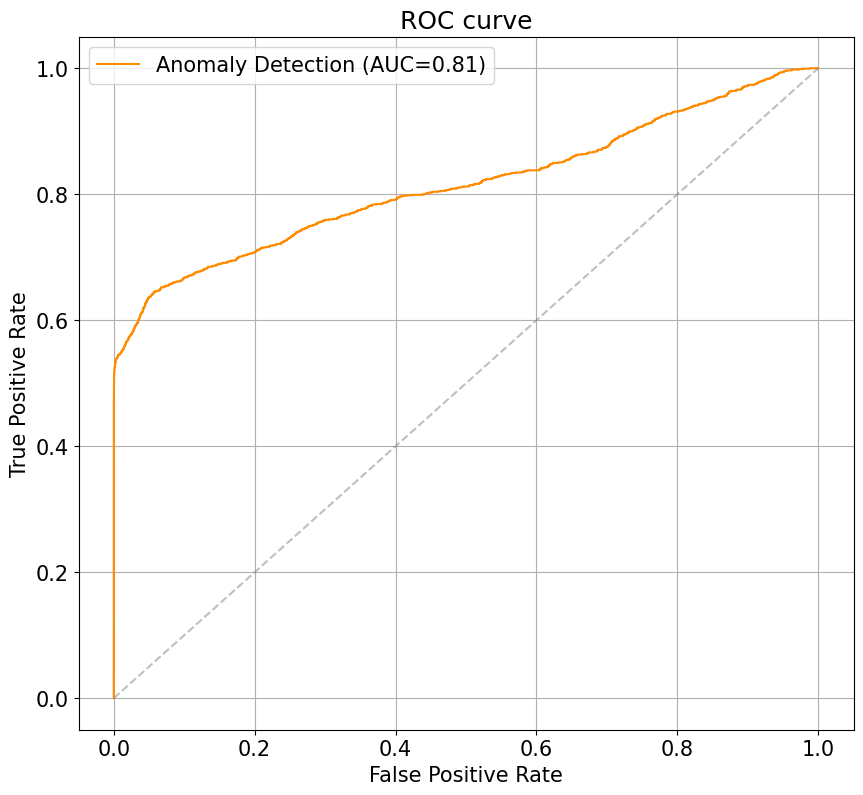


Best probability threshold: p=0.51%


In [41]:
fpr,tpr,thr = plot_roc_curve(predictions,save_as=os.path.join(logpath,'ROC_curve.png'))
th = thr[np.argmax(tpr-fpr)]
print(f"\nBest probability threshold: p={th*100:.2f}%")

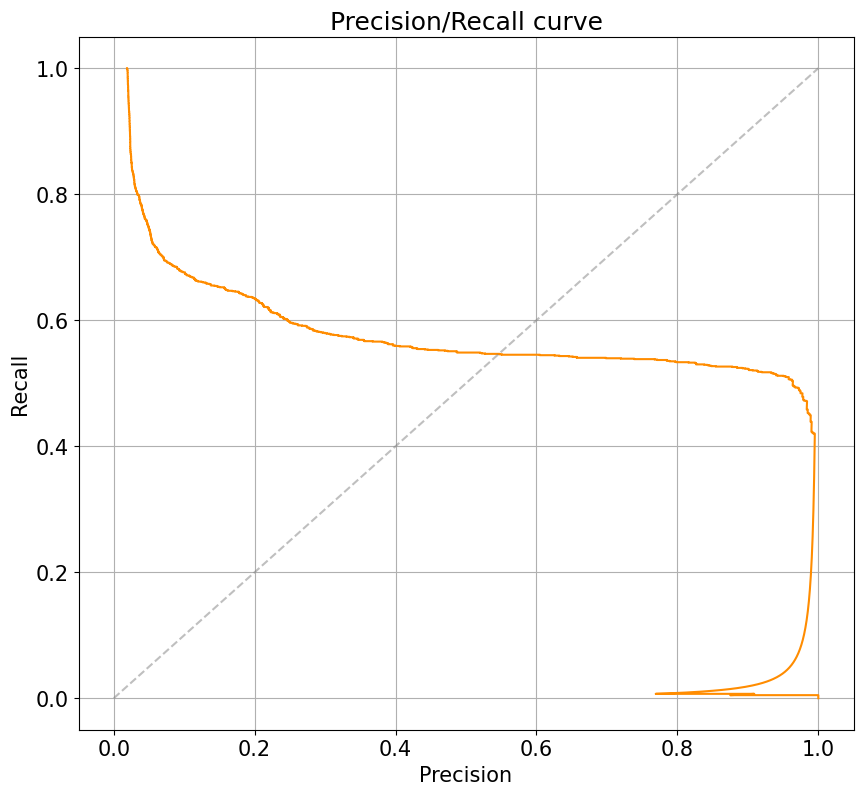

In [42]:
plot_pr_curve(predictions,save_as=os.path.join(logpath,'PR_curve.png'))

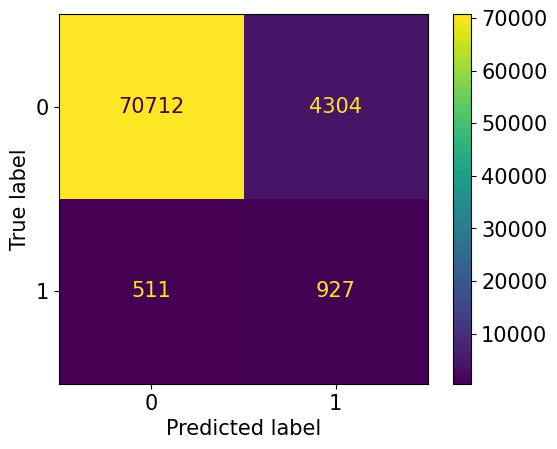


Classification Report
              precision    recall  f1-score   support

           0       0.99      0.94      0.97     75016
           1       0.18      0.64      0.28      1438

    accuracy                           0.94     76454
   macro avg       0.59      0.79      0.62     76454
weighted avg       0.98      0.94      0.95     76454



In [43]:
plot_classification_report(predictions,th,save_fig_as=os.path.join(logpath,'CM.png'))

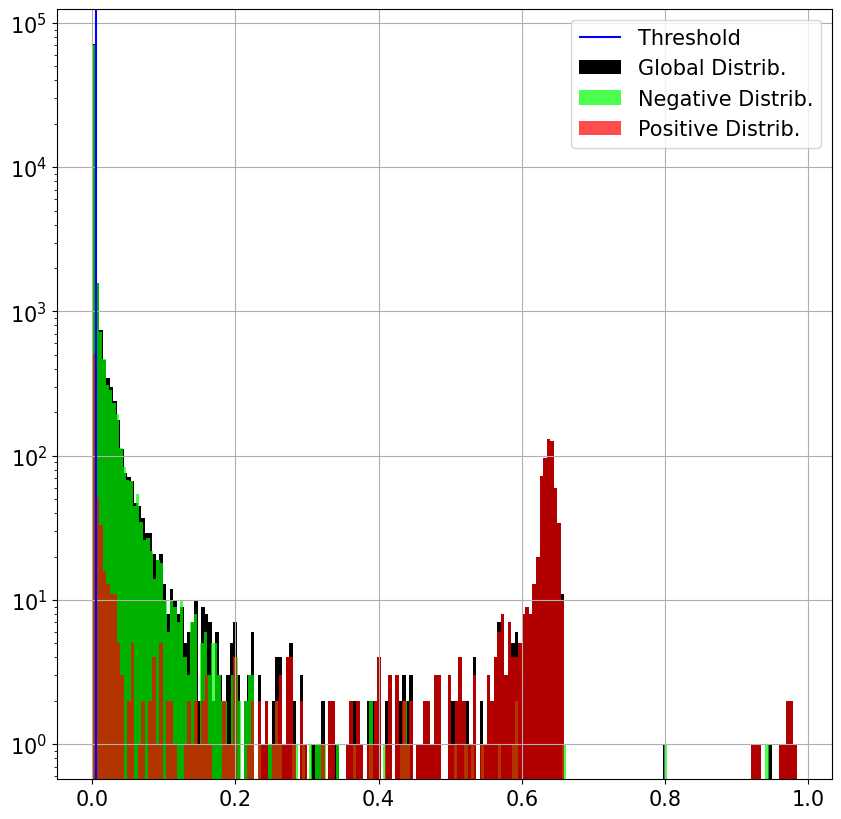

In [44]:
plot_distributions(predictions, th,save_as=os.path.join(logpath,'Prob_distr.png'))

## Window size 64

In [45]:
window_size = 64
labels = compute_labels(data,window_size)
for i,g in enumerate(data_list):
  g['node'].y = labels[i]

  0%|          | 0/2963 [00:00<?, ?it/s]

In [46]:
train_data, test_data = train_test_split(data_list,TRAIN_SPLIT) # train/test split, drop last window_size samples
logpath = f'{BASE_LOGPATH}/{window_size:02d}'
logger_name = f'{logpath}/{LOGGER_NAME}'
model = train(train_data, logpath, logger_name,device, NUM_EPOCHS, INITIAL_LR, TRAIN_BATCH_SIZE,ES_PATIENCE, ES_MIN_DELTA,MAX_NUM_CKPT,APPLY_WEIGHT_BALANCING)

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 1/200	 Train Loss: 0.10721573711273015, Train Acc at 50%: 0.9936478213092328


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 2/200	 Train Loss: 0.03972805435794219, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 3/200	 Train Loss: 0.04040166534008404, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 4/200	 Train Loss: 0.04041877779603788, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 5/200	 Train Loss: 0.03979442637755517, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 6/200	 Train Loss: 0.039318097292439895, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 7/200	 Train Loss: 0.03921043746916418, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 8/200	 Train Loss: 0.039075292594252485, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 9/200	 Train Loss: 0.03882723452812787, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 10/200	 Train Loss: 0.03914364660364479, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 11/200	 Train Loss: 0.03774741693075677, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 12/200	 Train Loss: 0.03816453270243715, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 13/200	 Train Loss: 0.03788440418014566, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 14/200	 Train Loss: 0.03753725210016455, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 15/200	 Train Loss: 0.03607767266832152, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 16/200	 Train Loss: 0.03814723409274714, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 17/200	 Train Loss: 0.037546858180462425, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 18/200	 Train Loss: 0.038298429252294465, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 19/200	 Train Loss: 0.03748507430293529, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 20/200	 Train Loss: 0.03702214554927003, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 21/200	 Train Loss: 0.03723601976681113, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 22/200	 Train Loss: 0.03685019151058369, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 23/200	 Train Loss: 0.03629079405825306, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 24/200	 Train Loss: 0.03605838385618735, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 25/200	 Train Loss: 0.03590113870021417, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 26/200	 Train Loss: 0.03568651439261847, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 27/200	 Train Loss: 0.035543208866419235, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 28/200	 Train Loss: 0.03549565206193515, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 29/200	 Train Loss: 0.03513401557874627, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 30/200	 Train Loss: 0.035069819915313626, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 31/200	 Train Loss: 0.035573962558658134, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 32/200	 Train Loss: 0.03663333335815383, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 33/200	 Train Loss: 0.03578770537356193, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 34/200	 Train Loss: 0.03546948924933703, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 35/200	 Train Loss: 0.03290352151183815, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 36/200	 Train Loss: 0.03605738191107791, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 37/200	 Train Loss: 0.04553044441423157, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 38/200	 Train Loss: 0.03964143811951963, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 39/200	 Train Loss: 0.031458604424274235, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 40/200	 Train Loss: 0.03788916205063802, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 41/200	 Train Loss: 0.043781595764139626, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 42/200	 Train Loss: 0.031889780278146096, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 43/200	 Train Loss: 0.03517760292856182, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 44/200	 Train Loss: 0.03538432117747976, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 45/200	 Train Loss: 0.03470858311514655, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 46/200	 Train Loss: 0.034165441264072345, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 47/200	 Train Loss: 0.03336254651215352, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 48/200	 Train Loss: 0.033525461144415354, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 49/200	 Train Loss: 0.03368319906027842, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 50/200	 Train Loss: 0.032506534981659695, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 51/200	 Train Loss: 0.03317090945342109, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 52/200	 Train Loss: 0.03253103062329702, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 53/200	 Train Loss: 0.03410928579950971, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 54/200	 Train Loss: 0.03145840458276334, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 55/200	 Train Loss: 0.032042563219560845, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 56/200	 Train Loss: 0.03297251063397743, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 57/200	 Train Loss: 0.03160339918036291, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 58/200	 Train Loss: 0.03325908062305174, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 59/200	 Train Loss: 0.03100437014511056, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 60/200	 Train Loss: 0.03224470153905777, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 61/200	 Train Loss: 0.03127657892094957, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 62/200	 Train Loss: 0.032462014125608306, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 63/200	 Train Loss: 0.030716913188234454, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 64/200	 Train Loss: 0.03221021929698538, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 65/200	 Train Loss: 0.03080212779852577, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 66/200	 Train Loss: 0.032273777110116114, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 67/200	 Train Loss: 0.03029514357314957, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 68/200	 Train Loss: 0.031987031917525395, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 69/200	 Train Loss: 0.030432155460532954, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 70/200	 Train Loss: 0.03200183935221654, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 71/200	 Train Loss: 0.029818242339051042, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 72/200	 Train Loss: 0.031316812765958935, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 73/200	 Train Loss: 0.03022367422623119, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 74/200	 Train Loss: 0.03115242806669227, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 75/200	 Train Loss: 0.02925621957152929, Train Acc at 50%: 0.9940010315983046


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 76/200	 Train Loss: 0.03129004495371824, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 77/200	 Train Loss: 0.033739576266791506, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 78/200	 Train Loss: 0.030263702754619766, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 79/200	 Train Loss: 0.028966430217841045, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 80/200	 Train Loss: 0.030336543616565, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 81/200	 Train Loss: 0.029387953452980984, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 82/200	 Train Loss: 0.02971635054404196, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 83/200	 Train Loss: 0.029643025134871666, Train Acc at 50%: 0.9940010315983046


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 84/200	 Train Loss: 0.030816198830937017, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 85/200	 Train Loss: 0.028555892790690665, Train Acc at 50%: 0.9937879841223566


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 86/200	 Train Loss: 0.029868397083176818, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 87/200	 Train Loss: 0.028987599730221626, Train Acc at 50%: 0.9940010315983046


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 88/200	 Train Loss: 0.028965335195863515, Train Acc at 50%: 0.993838442735081


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 89/200	 Train Loss: 0.02953254289244887, Train Acc at 50%: 0.9939449664730551


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 90/200	 Train Loss: 0.03171028153803458, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 91/200	 Train Loss: 0.028182120726435826, Train Acc at 50%: 0.9934684129084345


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 92/200	 Train Loss: 0.030031076285713484, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 93/200	 Train Loss: 0.02833248640683518, Train Acc at 50%: 0.9939617860106299


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 94/200	 Train Loss: 0.03139235285707878, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 95/200	 Train Loss: 0.02804985302177009, Train Acc at 50%: 0.9937543450472068


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 96/200	 Train Loss: 0.03158251711125143, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 97/200	 Train Loss: 0.029192697346612825, Train Acc at 50%: 0.9936478213092328


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 98/200	 Train Loss: 0.03325111160061027, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 99/200	 Train Loss: 0.029297918008433597, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 100/200	 Train Loss: 0.02848275901036644, Train Acc at 50%: 0.9937767710973067


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 101/200	 Train Loss: 0.03059620070298659, Train Acc at 50%: 0.9939113273979054


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 102/200	 Train Loss: 0.02777487110277298, Train Acc at 50%: 0.9944047005001009


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 103/200	 Train Loss: 0.028858904534757573, Train Acc at 50%: 0.9935076584961091


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 104/200	 Train Loss: 0.027984975707156433, Train Acc at 50%: 0.993631001771658


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 105/200	 Train Loss: 0.028551227997066393, Train Acc at 50%: 0.9939281469354803


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 106/200	 Train Loss: 0.027695629837369087, Train Acc at 50%: 0.9940402771859792


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 107/200	 Train Loss: 0.02929492586088, Train Acc at 50%: 0.9939337534480052


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 108/200	 Train Loss: 0.027377517740232053, Train Acc at 50%: 0.99450561772555


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 109/200	 Train Loss: 0.02818701273712044, Train Acc at 50%: 0.9935076584961091


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 110/200	 Train Loss: 0.027462058912007186, Train Acc at 50%: 0.9937823776098316


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 111/200	 Train Loss: 0.028086955103923717, Train Acc at 50%: 0.9938945078603305


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 112/200	 Train Loss: 0.027177117768124454, Train Acc at 50%: 0.9942365051243525


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 113/200	 Train Loss: 0.028930253429258427, Train Acc at 50%: 0.9939169339104303


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 114/200	 Train Loss: 0.027824212793080443, Train Acc at 50%: 0.9945897154134242


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 115/200	 Train Loss: 0.028654888252569184, Train Acc at 50%: 0.9936534278217578


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 116/200	 Train Loss: 0.027188399232047945, Train Acc at 50%: 0.9944663721378754


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 117/200	 Train Loss: 0.027909974914360522, Train Acc at 50%: 0.9935973626965082


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 118/200	 Train Loss: 0.027031345704920835, Train Acc at 50%: 0.9943542418873764


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 119/200	 Train Loss: 0.027620793297869806, Train Acc at 50%: 0.993631001771658


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 120/200	 Train Loss: 0.026833792789954812, Train Acc at 50%: 0.9944047005001009


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 121/200	 Train Loss: 0.027622753387209584, Train Acc at 50%: 0.9937767710973067


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 122/200	 Train Loss: 0.026579465723008847, Train Acc at 50%: 0.9944831916754502


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 123/200	 Train Loss: 0.027315000197979975, Train Acc at 50%: 0.9936478213092328


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 124/200	 Train Loss: 0.026434701080024558, Train Acc at 50%: 0.9944159135251508


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 125/200	 Train Loss: 0.027082138299348524, Train Acc at 50%: 0.9936926734094323


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 126/200	 Train Loss: 0.026437104653265233, Train Acc at 50%: 0.9942084725617277


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 127/200	 Train Loss: 0.027166326326535904, Train Acc at 50%: 0.9939113273979054


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 128/200	 Train Loss: 0.026262459598069117, Train Acc at 50%: 0.9945560763382746


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 129/200	 Train Loss: 0.02668694213010333, Train Acc at 50%: 0.9935076584961091


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 130/200	 Train Loss: 0.025989087361378976, Train Acc at 50%: 0.9944551591128254


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 131/200	 Train Loss: 0.027672768516033223, Train Acc at 50%: 0.9936590343342827


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 132/200	 Train Loss: 0.027155756626897804, Train Acc at 50%: 0.9940010315983046


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 133/200	 Train Loss: 0.025963291381143335, Train Acc at 50%: 0.9941355878989033


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 134/200	 Train Loss: 0.026099826933966494, Train Acc at 50%: 0.9934291673207598


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 135/200	 Train Loss: 0.025773674637959453, Train Acc at 50%: 0.9936197887466081


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 136/200	 Train Loss: 0.025780937371225415, Train Acc at 50%: 0.9934684129084345


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 137/200	 Train Loss: 0.025596995579440077, Train Acc at 50%: 0.9941299813863784


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 138/200	 Train Loss: 0.02568799738088263, Train Acc at 50%: 0.9935693301338835


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 139/200	 Train Loss: 0.025387657490440897, Train Acc at 50%: 0.9942477181494024


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 140/200	 Train Loss: 0.025984351391326165, Train Acc at 50%: 0.9942196855867776


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 141/200	 Train Loss: 0.02537533575563875, Train Acc at 50%: 0.9938048036599314


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 142/200	 Train Loss: 0.025190216815227567, Train Acc at 50%: 0.9943262093247517


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 143/200	 Train Loss: 0.02535221984169311, Train Acc at 50%: 0.9935973626965082


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 144/200	 Train Loss: 0.025980288859789532, Train Acc at 50%: 0.9940010315983046


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 145/200	 Train Loss: 0.02548425759174357, Train Acc at 50%: 0.9945785023883743


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 146/200	 Train Loss: 0.025371150034129646, Train Acc at 50%: 0.993518871521159


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 147/200	 Train Loss: 0.02470309628852375, Train Acc at 50%: 0.9945392568006997


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 148/200	 Train Loss: 0.024973889748456806, Train Acc at 50%: 0.9936197887466081


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 149/200	 Train Loss: 0.024831695669564766, Train Acc at 50%: 0.9938832948352807


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 150/200	 Train Loss: 0.02449580041551266, Train Acc at 50%: 0.9944495526003005


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 151/200	 Train Loss: 0.02451018900429739, Train Acc at 50%: 0.9936197887466081


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 152/200	 Train Loss: 0.02420357190036947, Train Acc at 50%: 0.9938216231975062


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 153/200	 Train Loss: 0.02435996841431006, Train Acc at 50%: 0.9937599515597317


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 154/200	 Train Loss: 0.02596514196828536, Train Acc at 50%: 0.9939673925231549


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 155/200	 Train Loss: 0.023842025756493742, Train Acc at 50%: 0.9944831916754502


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 156/200	 Train Loss: 0.023979201897173757, Train Acc at 50%: 0.9942308986118275


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 157/200	 Train Loss: 0.023767128990785695, Train Acc at 50%: 0.9942981767621268


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 158/200	 Train Loss: 0.023632474138208945, Train Acc at 50%: 0.9943766679374761


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 159/200	 Train Loss: 0.023536580326081778, Train Acc at 50%: 0.994286963737077


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 160/200	 Train Loss: 0.023405229702322217, Train Acc at 50%: 0.9940234576484044


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 161/200	 Train Loss: 0.023248011921898477, Train Acc at 50%: 0.9942589311744523


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 162/200	 Train Loss: 0.023397208666336818, Train Acc at 50%: 0.9937935906348815


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 163/200	 Train Loss: 0.023022702937357035, Train Acc at 50%: 0.9940963423112287


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 164/200	 Train Loss: 0.02298685191781273, Train Acc at 50%: 0.9941860465116279


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 165/200	 Train Loss: 0.023239079280116783, Train Acc at 50%: 0.9937543450472068


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 166/200	 Train Loss: 0.022619833401604304, Train Acc at 50%: 0.9939169339104303


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 167/200	 Train Loss: 0.02292711162505116, Train Acc at 50%: 0.9943766679374761


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 168/200	 Train Loss: 0.02355881200978056, Train Acc at 50%: 0.9935693301338835


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 169/200	 Train Loss: 0.023936819071533492, Train Acc at 50%: 0.9944887981879752


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 170/200	 Train Loss: 0.022699230707639996, Train Acc at 50%: 0.9935917561839833


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 171/200	 Train Loss: 0.02269710225867117, Train Acc at 50%: 0.9938889013478056


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 172/200	 Train Loss: 0.02224799131358486, Train Acc at 50%: 0.9941916530241529


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 173/200	 Train Loss: 0.022271170191294206, Train Acc at 50%: 0.9940683097486039


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 174/200	 Train Loss: 0.022141421037176784, Train Acc at 50%: 0.9942196855867776


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 175/200	 Train Loss: 0.02204901623882552, Train Acc at 50%: 0.9941075553362786


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 176/200	 Train Loss: 0.021975815388405172, Train Acc at 50%: 0.9943206028122267


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 177/200	 Train Loss: 0.021885291290300313, Train Acc at 50%: 0.9940907357987038


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 178/200	 Train Loss: 0.02179735828794978, Train Acc at 50%: 0.9943206028122267


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 179/200	 Train Loss: 0.021759507484519016, Train Acc at 50%: 0.9941692269740531


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 180/200	 Train Loss: 0.021612436451494556, Train Acc at 50%: 0.9942308986118275


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 181/200	 Train Loss: 0.021711399062713747, Train Acc at 50%: 0.9943710614249512


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 182/200	 Train Loss: 0.0214773627530114, Train Acc at 50%: 0.9939898185732547


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 183/200	 Train Loss: 0.02193655063784592, Train Acc at 50%: 0.9943542418873764


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 184/200	 Train Loss: 0.021427989580822083, Train Acc at 50%: 0.993737525509632


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 185/200	 Train Loss: 0.021353497973245723, Train Acc at 50%: 0.9943710614249512


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 186/200	 Train Loss: 0.02120850200686868, Train Acc at 50%: 0.9943542418873764


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 187/200	 Train Loss: 0.02122014072171234, Train Acc at 50%: 0.9943766679374761


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 188/200	 Train Loss: 0.02108654804045379, Train Acc at 50%: 0.9943318158372766


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 189/200	 Train Loss: 0.021142811638436707, Train Acc at 50%: 0.9944439460877755


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 190/200	 Train Loss: 0.020965561799711544, Train Acc at 50%: 0.994062703236079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 191/200	 Train Loss: 0.02112798093452855, Train Acc at 50%: 0.9943542418873764


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 192/200	 Train Loss: 0.02099705463178528, Train Acc at 50%: 0.9936870668969074


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 193/200	 Train Loss: 0.02102074953860154, Train Acc at 50%: 0.9945785023883743


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 194/200	 Train Loss: 0.020758668347277198, Train Acc at 50%: 0.9943318158372766


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 195/200	 Train Loss: 0.020850876041672507, Train Acc at 50%: 0.9944607656253505


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 196/200	 Train Loss: 0.02066129214914795, Train Acc at 50%: 0.9942196855867776


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 197/200	 Train Loss: 0.020737491991009258, Train Acc at 50%: 0.9945336502881748


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 198/200	 Train Loss: 0.02061372713199903, Train Acc at 50%: 0.9940963423112287


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 199/200	 Train Loss: 0.02058862649071912, Train Acc at 50%: 0.9945336502881748


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 200/200	 Train Loss: 0.020566338687143988, Train Acc at 50%: 0.994281357224552


In [47]:
test_loader = DataLoader(test_data, batch_size = TEST_BATCH_SIZE, shuffle = False)
predictions = get_predictions(model,test_loader,device)
predictions.to_csv(os.path.join(logpath,'predictions.csv'))

  0%|          | 0/14 [00:00<?, ?it/s]

76454 (76454,)


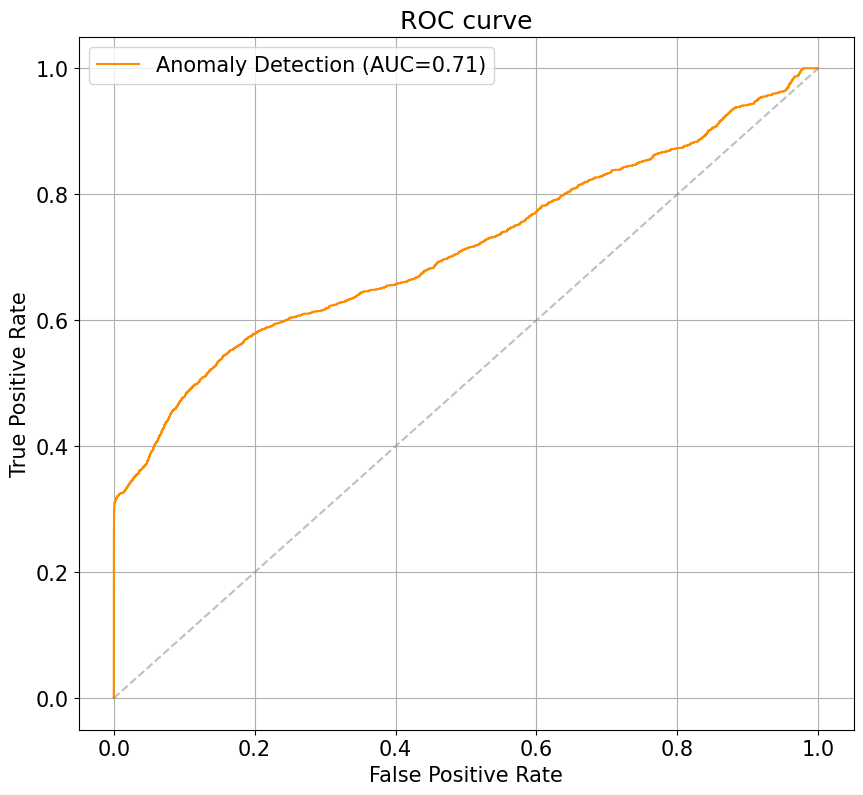


Best probability threshold: p=0.57%


In [48]:
fpr,tpr,thr = plot_roc_curve(predictions,save_as=os.path.join(logpath,'ROC_curve.png'))
th = thr[np.argmax(tpr-fpr)]
print(f"\nBest probability threshold: p={th*100:.2f}%")

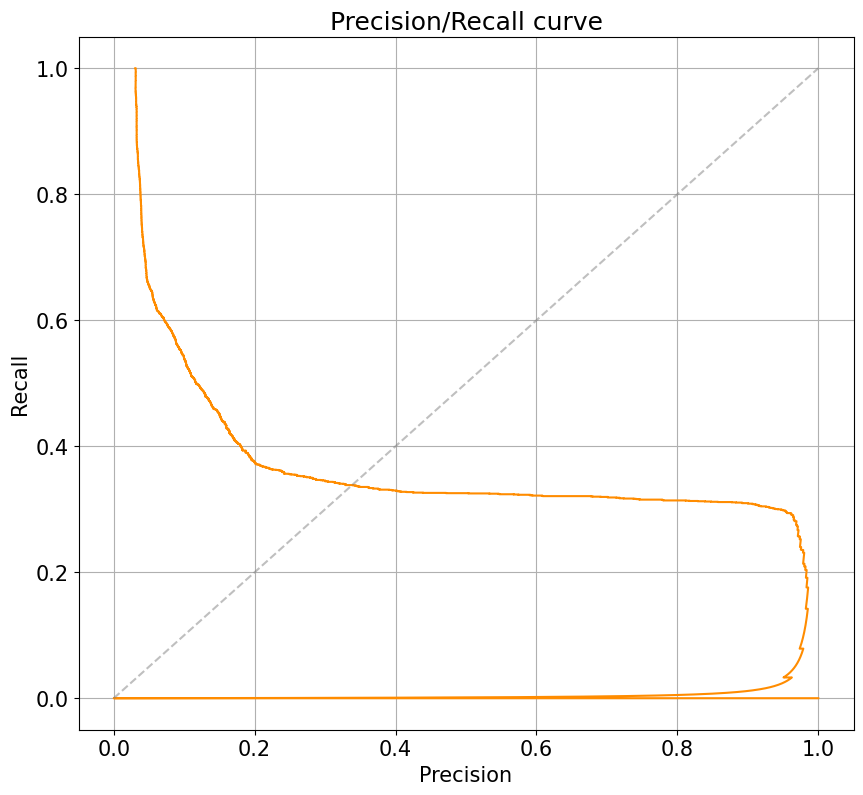

In [49]:
plot_pr_curve(predictions,save_as=os.path.join(logpath,'PR_curve.png'))

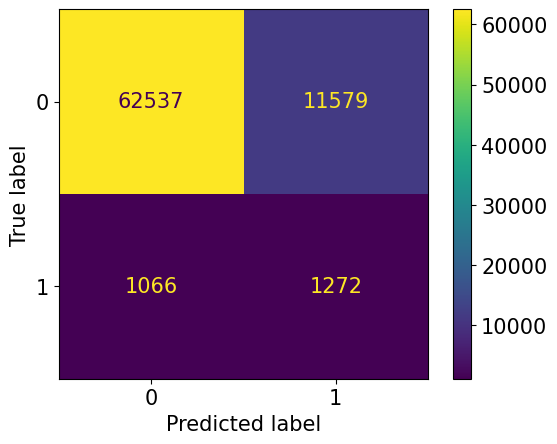


Classification Report
              precision    recall  f1-score   support

           0       0.98      0.84      0.91     74116
           1       0.10      0.54      0.17      2338

    accuracy                           0.83     76454
   macro avg       0.54      0.69      0.54     76454
weighted avg       0.96      0.83      0.89     76454



In [50]:
plot_classification_report(predictions,th,save_fig_as=os.path.join(logpath,'CM.png'))

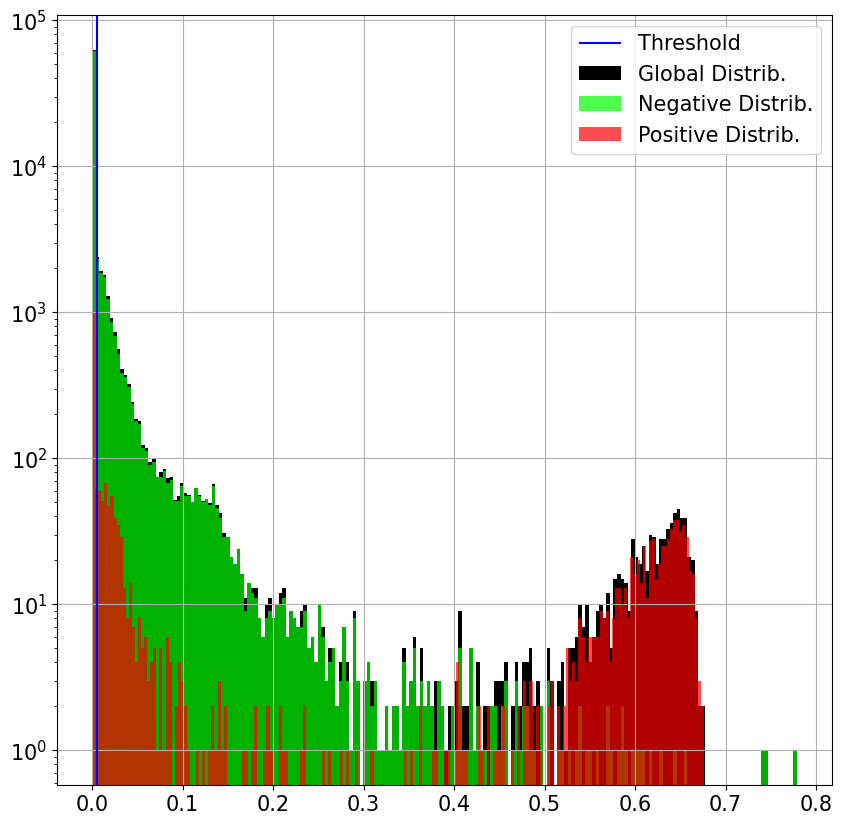

In [51]:
plot_distributions(predictions, th,save_as=os.path.join(logpath,'Prob_distr.png'))

## Window size 192

In [52]:
window_size = 192
labels = compute_labels(data,window_size)
for i,g in enumerate(data_list):
  g['node'].y = labels[i]

  0%|          | 0/2963 [00:00<?, ?it/s]

In [53]:
train_data, test_data = train_test_split(data_list,TRAIN_SPLIT) # train/test split, drop last window_size samples
logpath = f'{BASE_LOGPATH}/{window_size:02d}'
logger_name = f'{logpath}/{LOGGER_NAME}'
model = train(train_data, logpath, logger_name,device, NUM_EPOCHS, INITIAL_LR, TRAIN_BATCH_SIZE,ES_PATIENCE, ES_MIN_DELTA,MAX_NUM_CKPT,APPLY_WEIGHT_BALANCING)

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 1/200	 Train Loss: 0.16399955813673162, Train Acc at 50%: 0.9850362180709111


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 2/200	 Train Loss: 0.09393188315046758, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 3/200	 Train Loss: 0.0967368585974468, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 4/200	 Train Loss: 0.09721797840371375, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 5/200	 Train Loss: 0.0970654199418044, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 6/200	 Train Loss: 0.09818558362393756, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 7/200	 Train Loss: 0.09967180220293893, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 8/200	 Train Loss: 0.09870798575875737, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 9/200	 Train Loss: 0.09656729444422642, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 10/200	 Train Loss: 0.09441173273124061, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 11/200	 Train Loss: 0.09329586153525936, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 12/200	 Train Loss: 0.09221878696794196, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 13/200	 Train Loss: 0.07742974317091733, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 14/200	 Train Loss: 0.08523313806317419, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 15/200	 Train Loss: 0.08505821925248369, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 16/200	 Train Loss: 0.09317873798454285, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 17/200	 Train Loss: 0.08692016177241484, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 18/200	 Train Loss: 0.0822679882764319, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 19/200	 Train Loss: 0.07993760082962369, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 20/200	 Train Loss: 0.09208181066877284, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 21/200	 Train Loss: 0.09104490150759122, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 22/200	 Train Loss: 0.08790087988081956, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 23/200	 Train Loss: 0.08536857038135498, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 24/200	 Train Loss: 0.08230205988526272, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 25/200	 Train Loss: 0.08054818508429391, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 26/200	 Train Loss: 0.08003497565897547, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 27/200	 Train Loss: 0.07922140170522078, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 28/200	 Train Loss: 0.07952614084645725, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 29/200	 Train Loss: 0.07773010769935357, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 30/200	 Train Loss: 0.07704572991361766, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 31/200	 Train Loss: 0.07936086917938878, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 32/200	 Train Loss: 0.08078508761402245, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 33/200	 Train Loss: 0.08253675047059665, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 34/200	 Train Loss: 0.07912817153405395, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 35/200	 Train Loss: 0.0773322205135986, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 36/200	 Train Loss: 0.07668547315812048, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 37/200	 Train Loss: 0.07620357041113958, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 38/200	 Train Loss: 0.07576160859078906, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 39/200	 Train Loss: 0.07536133425712307, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 40/200	 Train Loss: 0.0749699186512553, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 41/200	 Train Loss: 0.0745723106961046, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 42/200	 Train Loss: 0.07427773335881961, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 43/200	 Train Loss: 0.07375274149702295, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 44/200	 Train Loss: 0.07354928641359804, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 45/200	 Train Loss: 0.07334445160248144, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 46/200	 Train Loss: 0.07248467319638492, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 47/200	 Train Loss: 0.07254018533553576, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 48/200	 Train Loss: 0.07258533856677916, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 49/200	 Train Loss: 0.07177258587950763, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 50/200	 Train Loss: 0.07180435246707575, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 51/200	 Train Loss: 0.07269203750826961, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 52/200	 Train Loss: 0.07189115485923449, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 53/200	 Train Loss: 0.07144862362745565, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 54/200	 Train Loss: 0.07056639727081979, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 55/200	 Train Loss: 0.07273279970138313, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 56/200	 Train Loss: 0.07102735772248044, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 57/200	 Train Loss: 0.06848635374851428, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 58/200	 Train Loss: 0.07007059321983417, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 59/200	 Train Loss: 0.06869292416946525, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 60/200	 Train Loss: 0.06924804008586374, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 61/200	 Train Loss: 0.06901045316739925, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 62/200	 Train Loss: 0.06588847433303525, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 63/200	 Train Loss: 0.07003670776473953, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 64/200	 Train Loss: 0.06733836008282221, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 65/200	 Train Loss: 0.06777747484603115, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 66/200	 Train Loss: 0.06780062361063612, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 67/200	 Train Loss: 0.06353992047161984, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 68/200	 Train Loss: 0.07099489579595658, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 69/200	 Train Loss: 0.07021755064432846, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 70/200	 Train Loss: 0.06755707429750397, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 71/200	 Train Loss: 0.06788004007955642, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 72/200	 Train Loss: 0.06492728046648988, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 73/200	 Train Loss: 0.06600286580391783, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 74/200	 Train Loss: 0.06366192782035612, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 75/200	 Train Loss: 0.06268295627200555, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 76/200	 Train Loss: 0.06151211497275235, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 77/200	 Train Loss: 0.06287454131719405, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 78/200	 Train Loss: 0.06888734532157555, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 79/200	 Train Loss: 0.06352897025184455, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 80/200	 Train Loss: 0.06341472660892893, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 81/200	 Train Loss: 0.061857003094794916, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 82/200	 Train Loss: 0.07050871698815343, Train Acc at 50%: 0.9853445762597833


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 83/200	 Train Loss: 0.06642864867455035, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 84/200	 Train Loss: 0.06253569224135756, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 85/200	 Train Loss: 0.0652353156238787, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 86/200	 Train Loss: 0.0650238340293585, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 87/200	 Train Loss: 0.06454339313671761, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 88/200	 Train Loss: 0.060377617452933324, Train Acc at 50%: 0.9855295911731067


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 89/200	 Train Loss: 0.06496225546845215, Train Acc at 50%: 0.9848792357202126


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 90/200	 Train Loss: 0.06460043830663699, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 91/200	 Train Loss: 0.06928618517645097, Train Acc at 50%: 0.9843522235428674


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 92/200	 Train Loss: 0.06792052851717555, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 93/200	 Train Loss: 0.07011841282959286, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 94/200	 Train Loss: 0.06194314299865724, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 95/200	 Train Loss: 0.0638179739272639, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 96/200	 Train Loss: 0.06103517815043955, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 97/200	 Train Loss: 0.0625265488078452, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 98/200	 Train Loss: 0.06314951776108127, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 99/200	 Train Loss: 0.06082278768767801, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 100/200	 Train Loss: 0.059820809727579555, Train Acc at 50%: 0.9853557892848333


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 101/200	 Train Loss: 0.057249260115550225, Train Acc at 50%: 0.9845316319436658


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 102/200	 Train Loss: 0.057938527174415805, Train Acc at 50%: 0.9851371352963603


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 103/200	 Train Loss: 0.05894183011110706, Train Acc at 50%: 0.9854735260478572


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 104/200	 Train Loss: 0.057795320200194546, Train Acc at 50%: 0.9850418245834361


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 105/200	 Train Loss: 0.05757141558133928, Train Acc at 50%: 0.9850418245834361


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 106/200	 Train Loss: 0.05657381770915095, Train Acc at 50%: 0.9851259222713104


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 107/200	 Train Loss: 0.05571105536816566, Train Acc at 50%: 0.9849857594581867


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 108/200	 Train Loss: 0.05671954870903041, Train Acc at 50%: 0.9853333632347334


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 109/200	 Train Loss: 0.056104912873043325, Train Acc at 50%: 0.9855688367607813


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 110/200	 Train Loss: 0.05575436348737694, Train Acc at 50%: 0.9850530376084861


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 111/200	 Train Loss: 0.05677682383356507, Train Acc at 50%: 0.9853670023098832


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 112/200	 Train Loss: 0.05742909009980994, Train Acc at 50%: 0.9854791325603821


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 113/200	 Train Loss: 0.05824573559021159, Train Acc at 50%: 0.9849633334080868


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 114/200	 Train Loss: 0.05985305812481779, Train Acc at 50%: 0.9852380525218093


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 115/200	 Train Loss: 0.05930080569089054, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 116/200	 Train Loss: 0.05590766656423101, Train Acc at 50%: 0.985708999573905


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 117/200	 Train Loss: 0.054304225882535154, Train Acc at 50%: 0.9848455966450629


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 118/200	 Train Loss: 0.0549912043454677, Train Acc at 50%: 0.984946513870512


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 119/200	 Train Loss: 0.05613405140786538, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 120/200	 Train Loss: 0.054053887433142336, Train Acc at 50%: 0.9853501827723083


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 121/200	 Train Loss: 0.05262330692081922, Train Acc at 50%: 0.9844923863559911


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 122/200	 Train Loss: 0.05412390313838555, Train Acc at 50%: 0.9851932004216097


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 123/200	 Train Loss: 0.05386536297438104, Train Acc at 50%: 0.9854454934852325


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 124/200	 Train Loss: 0.05231416031612321, Train Acc at 50%: 0.9850642506335359


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 125/200	 Train Loss: 0.053232451221589, Train Acc at 50%: 0.9847502859321388


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 126/200	 Train Loss: 0.053277522326184094, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 127/200	 Train Loss: 0.05192844429964847, Train Acc at 50%: 0.985271691596959


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 128/200	 Train Loss: 0.05348898202026474, Train Acc at 50%: 0.9847502859321388


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 129/200	 Train Loss: 0.05371227342681258, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 130/200	 Train Loss: 0.05190399245889025, Train Acc at 50%: 0.985383821847458


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 131/200	 Train Loss: 0.052927931084748046, Train Acc at 50%: 0.9846605817317395


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 132/200	 Train Loss: 0.05219474269436377, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 133/200	 Train Loss: 0.050587830792999146, Train Acc at 50%: 0.9851819873965598


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 134/200	 Train Loss: 0.05139393669686708, Train Acc at 50%: 0.9847390729070888


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 135/200	 Train Loss: 0.05060315015046478, Train Acc at 50%: 0.9855295911731067


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 136/200	 Train Loss: 0.04976420453749075, Train Acc at 50%: 0.9851763808840349


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 137/200	 Train Loss: 0.04978002760506604, Train Acc at 50%: 0.9851539548339351


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 138/200	 Train Loss: 0.04961998466794028, Train Acc at 50%: 0.9851819873965598


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 139/200	 Train Loss: 0.04913651603953152, Train Acc at 50%: 0.9855688367607813


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 140/200	 Train Loss: 0.049478540679102845, Train Acc at 50%: 0.9851875939090848


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 141/200	 Train Loss: 0.049074400917856184, Train Acc at 50%: 0.9854735260478572


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 142/200	 Train Loss: 0.04945918616565002, Train Acc at 50%: 0.9854230674351326


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 143/200	 Train Loss: 0.04880065089858379, Train Acc at 50%: 0.9856585409611806


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 144/200	 Train Loss: 0.048061932647213, Train Acc at 50%: 0.9858940144872284


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 145/200	 Train Loss: 0.04836199056949553, Train Acc at 50%: 0.9851875939090848


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 146/200	 Train Loss: 0.04808355385615931, Train Acc at 50%: 0.9856865735238053


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 147/200	 Train Loss: 0.048792076876499745, Train Acc at 50%: 0.9854006413850328


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 148/200	 Train Loss: 0.0480703533662202, Train Acc at 50%: 0.9859612926375277


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 149/200	 Train Loss: 0.04735383121033392, Train Acc at 50%: 0.9859388665874279


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 150/200	 Train Loss: 0.04731280621194579, Train Acc at 50%: 0.9856192953735059


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 151/200	 Train Loss: 0.04756885520095142, Train Acc at 50%: 0.9856249018860308


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 152/200	 Train Loss: 0.04716878344635128, Train Acc at 50%: 0.9855520172232065


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 153/200	 Train Loss: 0.04875004993300217, Train Acc at 50%: 0.9854623130228073


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 154/200	 Train Loss: 0.04732693199545592, Train Acc at 50%: 0.9861070619631764


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 155/200	 Train Loss: 0.04664587760142181, Train Acc at 50%: 0.9855744432733062


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 156/200	 Train Loss: 0.048805386868636606, Train Acc at 50%: 0.9851091027337355


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 157/200	 Train Loss: 0.04681491614409298, Train Acc at 50%: 0.9860566033504519


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 158/200	 Train Loss: 0.046008990918851335, Train Acc at 50%: 0.9858491623870288


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 159/200	 Train Loss: 0.0466446402265872, Train Acc at 50%: 0.9855351976856316


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 160/200	 Train Loss: 0.04613077378808224, Train Acc at 50%: 0.9857482451615797


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 161/200	 Train Loss: 0.0467422723861037, Train Acc at 50%: 0.9855408041981566


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 162/200	 Train Loss: 0.04588387644525381, Train Acc at 50%: 0.9858771949496535


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 163/200	 Train Loss: 0.04597912966952412, Train Acc at 50%: 0.9855912628108812


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 164/200	 Train Loss: 0.0455994116359313, Train Acc at 50%: 0.9858715884371285


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 165/200	 Train Loss: 0.046011460193410667, Train Acc at 50%: 0.9855688367607813


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 166/200	 Train Loss: 0.045441881774243964, Train Acc at 50%: 0.9858547688995537


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 167/200	 Train Loss: 0.0458902412604982, Train Acc at 50%: 0.9856809670112803


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 168/200	 Train Loss: 0.04527420105882493, Train Acc at 50%: 0.985826736336929


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 169/200	 Train Loss: 0.0457365248128476, Train Acc at 50%: 0.9857987037743042


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 170/200	 Train Loss: 0.04501795496586335, Train Acc at 50%: 0.9858828014621784


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 171/200	 Train Loss: 0.04536657985040423, Train Acc at 50%: 0.9857930972617793


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 172/200	 Train Loss: 0.044789889263493476, Train Acc at 50%: 0.9859444730999529


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 173/200	 Train Loss: 0.04520352286528532, Train Acc at 50%: 0.9858547688995537


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 174/200	 Train Loss: 0.044584586330481485, Train Acc at 50%: 0.9859837186876276


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 175/200	 Train Loss: 0.04504686080851517, Train Acc at 50%: 0.9859220470498531


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 176/200	 Train Loss: 0.044394296148781424, Train Acc at 50%: 0.9859949317126775


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 177/200	 Train Loss: 0.04489122807240391, Train Acc at 50%: 0.985933260074903


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 178/200	 Train Loss: 0.04422165498380419, Train Acc at 50%: 0.9859781121751026


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 179/200	 Train Loss: 0.04469963755210553, Train Acc at 50%: 0.9859837186876276


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 180/200	 Train Loss: 0.0440755160882381, Train Acc at 50%: 0.9859725056625777


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 181/200	 Train Loss: 0.04453063459764863, Train Acc at 50%: 0.9861687336009509


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 182/200	 Train Loss: 0.04390744937757199, Train Acc at 50%: 0.9859781121751026


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 183/200	 Train Loss: 0.04441510977901931, Train Acc at 50%: 0.9861911596510506


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 184/200	 Train Loss: 0.04377727316488333, Train Acc at 50%: 0.9859893252001525


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 185/200	 Train Loss: 0.04425636718049186, Train Acc at 50%: 0.9862304052387253


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 186/200	 Train Loss: 0.04362933569571915, Train Acc at 50%: 0.9860173577627772


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 187/200	 Train Loss: 0.044104211139159244, Train Acc at 50%: 0.9861967661635757


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 188/200	 Train Loss: 0.043523447070492084, Train Acc at 50%: 0.9860005382252024


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 189/200	 Train Loss: 0.043959380794856305, Train Acc at 50%: 0.9861855531385257


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 190/200	 Train Loss: 0.04340284682499692, Train Acc at 50%: 0.9860005382252024


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 191/200	 Train Loss: 0.043750746257477685, Train Acc at 50%: 0.9863201094391245


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 192/200	 Train Loss: 0.04326040910371488, Train Acc at 50%: 0.9860285707878271


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 193/200	 Train Loss: 0.043643913175795, Train Acc at 50%: 0.9863369289766993


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 194/200	 Train Loss: 0.04318466369597424, Train Acc at 50%: 0.9861911596510506


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 195/200	 Train Loss: 0.04353552516290423, Train Acc at 50%: 0.9864658787647732


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 196/200	 Train Loss: 0.043086590790111796, Train Acc at 50%: 0.9863088964140746


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 197/200	 Train Loss: 0.04339454655840724, Train Acc at 50%: 0.9865499764526474


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 198/200	 Train Loss: 0.04300185525193565, Train Acc at 50%: 0.9863537485142742


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 199/200	 Train Loss: 0.04332245031140673, Train Acc at 50%: 0.9865780090152722


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 200/200	 Train Loss: 0.042914278131727816, Train Acc at 50%: 0.9863817810768989


In [54]:
test_loader = DataLoader(test_data, batch_size = TEST_BATCH_SIZE, shuffle = False)
predictions = get_predictions(model,test_loader,device)
predictions.to_csv(os.path.join(logpath,'predictions.csv'))

  0%|          | 0/14 [00:00<?, ?it/s]

76454 (76454,)


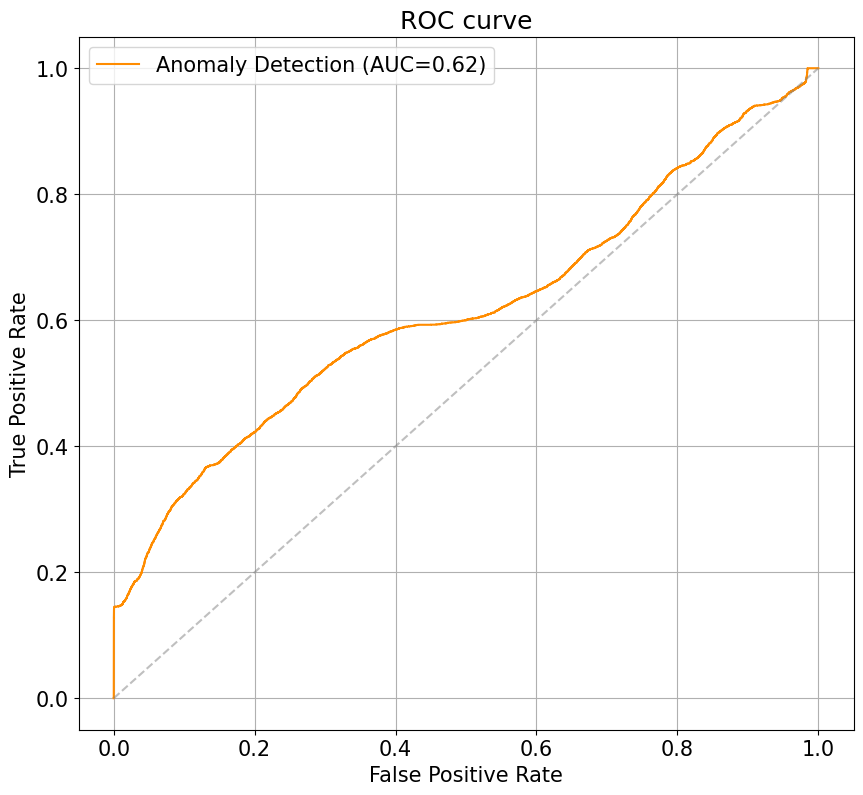


Best probability threshold: p=1.51%


In [55]:
fpr,tpr,thr = plot_roc_curve(predictions,save_as=os.path.join(logpath,'ROC_curve.png'))
th = thr[np.argmax(tpr-fpr)]
print(f"\nBest probability threshold: p={th*100:.2f}%")

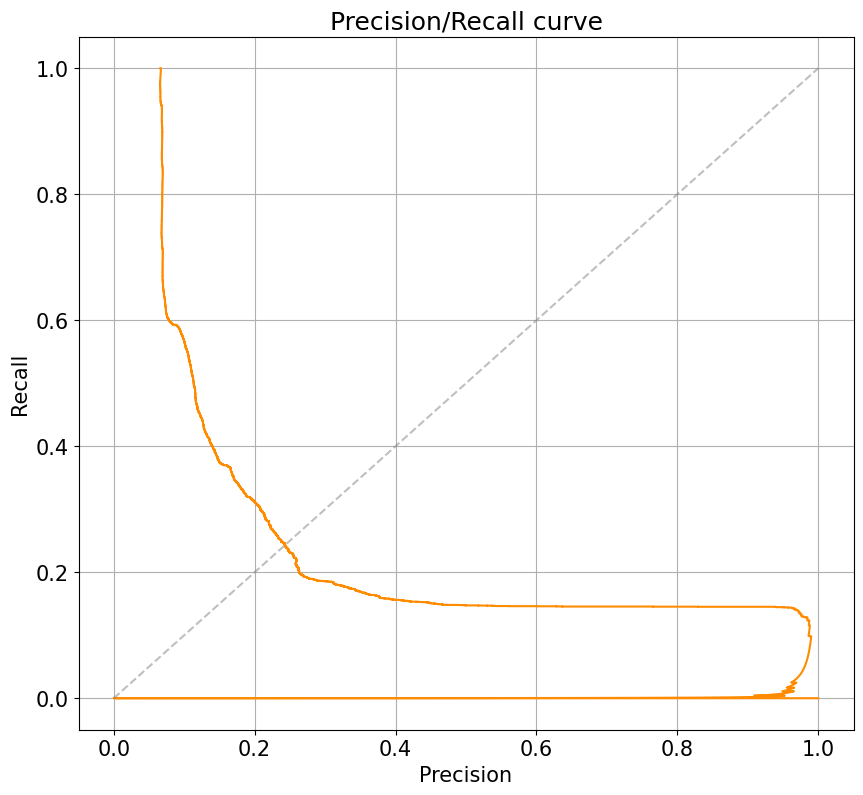

In [56]:
plot_pr_curve(predictions,save_as=os.path.join(logpath,'PR_curve.png'))

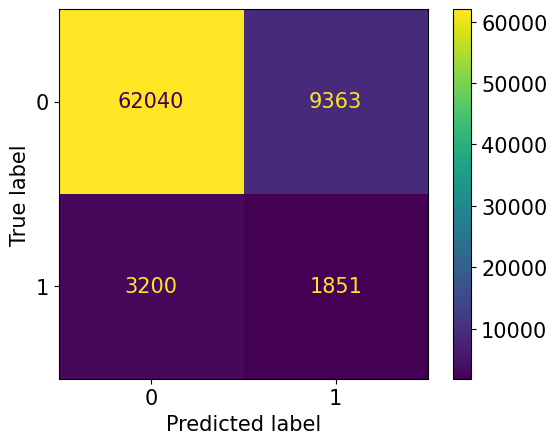


Classification Report
              precision    recall  f1-score   support

           0       0.95      0.87      0.91     71403
           1       0.17      0.37      0.23      5051

    accuracy                           0.84     76454
   macro avg       0.56      0.62      0.57     76454
weighted avg       0.90      0.84      0.86     76454



In [57]:
plot_classification_report(predictions,th,save_fig_as=os.path.join(logpath,'CM.png'))

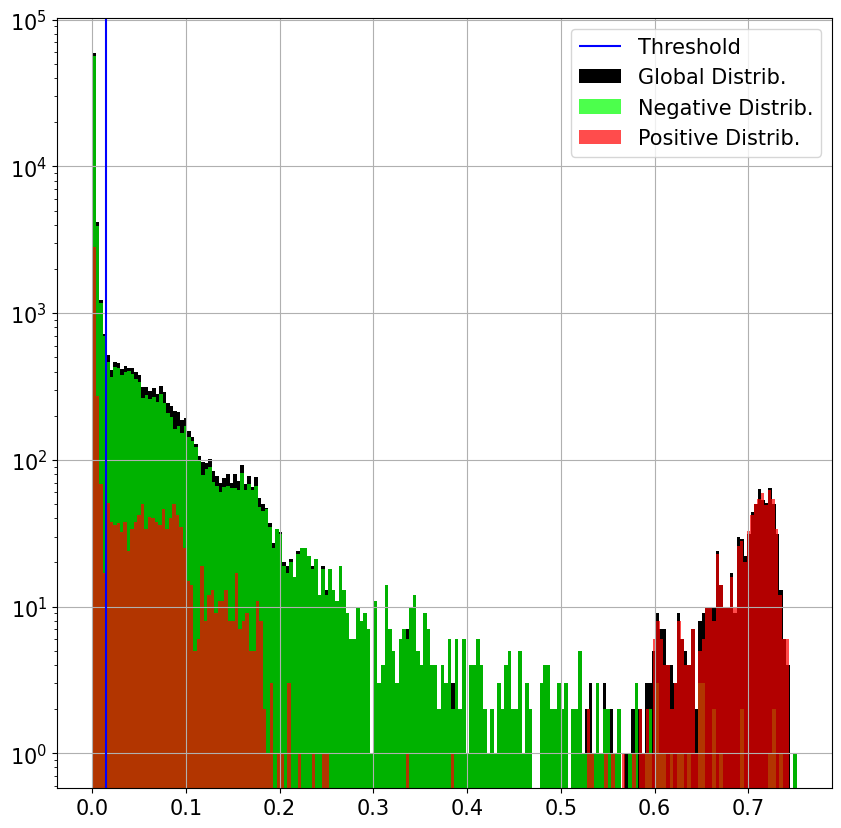

In [58]:
plot_distributions(predictions, th,save_as=os.path.join(logpath,'Prob_distr.png'))

In [59]:
! rm -r  drive/MyDrive/HPCDATA/multigraph2
! cp -r out drive/MyDrive/HPCDATA/multigraph2